In [1]:
# 0.path

import os
import sys

# 1.basics

import numpy as np
np.set_printoptions(suppress=True)
import pandas as pd
pd.options.display.max_rows = 999
pd.options.display.max_columns = 200
pd.set_option('display.width', 2000)
# 2.plot

import scienceplots
import matplotlib as mpl
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import cm
# myfont = mpl.font_manager.FontProperties(fname="/Library/Fonts/SimHei.ttf")  # "/Library/Fonts/Songti.ttc")
# mpl.rcParams["axes.unicode_minus"] = False
# plt.style.use('ggplot')
# plt.style.use(['science','no-latex'])
plt.style.use(['nature'])
# plt.style.use(['science'])
plt.rcParams['axes.facecolor']='white'
plt.rcParams['font.sans-serif'] = ['Arial']
%matplotlib inline

import cmaps
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objs as go


try:
    import pyecharts
except:
    os.system("pip install pyecharts")
    import pyecharts

# 4. others

try:
    from bayes_opt import BayesianOptimization
except:
    os.system("pip install bayesian-optimization")
    from bayes_opt import BayesianOptimization
try:
    import missingno as msno
except:
    os.system("pip install missingno")
    import missingno as msno
try:
    import jieba
    import jieba.posseg as pseg
except:
    os.system("pip install jieba")
    import jieba
    import jieba.posseg as pseg
try:
    import xgboost as xgb
    import xgboost.sklearn
    from xgboost import XGBClassifier
except:
    os.system("pip install xgboost")
    import xgboost as xgb
    import xgboost.sklearn
    from xgboost import XGBClassifier
try:
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    import statsmodels.api as sm
    import statsmodels.stats.api as sms
    import statsmodels.formula.api as smf
except:
    os.system("pip install -i https://pypi.tuna.tsinghua.edu.cn/simple scipy==1.2.1 --upgrade")
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    import statsmodels.api as sm
    import statsmodels.stats.api as sms
    import statsmodels.formula.api as smf

from scipy import sparse
from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats import chisquare
from scipy.stats import ks_2samp
from scipy.stats import beta, norm
from scipy.stats import chi2
from scipy.stats import truncnorm
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
from scipy.interpolate import interp1d

import glob
import time
import datetime
from patsy import dmatrices
import math
import bisect
import hashlib
from fuzzywuzzy import fuzz
import itertools
from itertools import combinations
from collections import defaultdict, Counter
import operator
from operator import itemgetter
import re
import pickle
import json
from tqdm.notebook import tqdm
import traceback
import warnings
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
warnings.filterwarnings("ignore")


/Users/linzipeng/opt/anaconda3/lib/python3.9/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
plt.rcParams['axes.facecolor']='white'
plt.rcParams['font.sans-serif'] = ['Arial']
plt.style.use(['science','no-latex'])
%matplotlib inline


# data preparation

This dataset is a merged compilation of GDELT Event, GDELT GKG, and mining site data, characterized by a many-to-many relationship between its components. A single mining site can be linked to multiple GKG records (e.g., different reports over time or topics), while a single GKG record can correspond to multiple GDELT Event records (e.g., various events stemming from the same topic). As a result, the dataset is structured such that each possible combination of mining sites, GKG records, and GDELT Event records is represented as a single row. This leads to a significantly expanded dataset where each row encapsulates a unique "mining site-GKG-GDELT Event" combination, offering a rich basis for analyzing relationships between mining activities, media coverage, and associated events.

In [3]:
df = pd.read_csv('mining_water_GKG_event.csv')
df = df[df.dev_stage.notnull()]
df.shape


(4363142, 18)

## mineral production

In [4]:
production = pd.DataFrame()

fs = glob.glob('data/production_data/*.xlsx')
for f in fs:
    print(f)
    temp = pd.read_excel(f, skiprows=1)
    temp = temp[['\n\tCountry'] + [i for i in temp.columns if str(i).startswith('Unnamed')]]
    temp.columns = ['country'] + list(range(2016, 2023))
    temp['metal'] = f.split('/')[-1].split('.')[0]
    production = pd.concat([production, temp])
    
production = production.dropna(axis=0, thresh=3)


data/production_data/copper.xlsx
data/production_data/nickel.xlsx
data/production_data/molybdenum.xlsx
data/production_data/manganese.xlsx
data/production_data/tin.xlsx
data/production_data/vanadium.xlsx
data/production_data/PGM.xlsx
data/production_data/uranium.xlsx
data/production_data/bauxite.xlsx
data/production_data/lithium.xlsx
data/production_data/lead.xlsx
data/production_data/graphite.xlsx
data/production_data/cobalt.xlsx
data/production_data/zinc.xlsx


In [5]:
country_to_region = {
    "Canada": "North America",
    "USA": "North America",
    "Mexico": "North America",
    "Dominican Republic": "North America",
    "Cuba": "North America",
    "Guatemala": "North America",
    "Honduras": "North America",
    "Jamaica": "North America",
    "South Africa": "Southern Africa",
    "Botswana": "Southern Africa",
    "Namibia": "Southern Africa",
    "Zimbabwe": "Southern Africa",
    "Zambia": "Southern Africa",
    "Mozambique": "Southern Africa",
    "Argentina": "Central & South America",
    "Bolivia": "Central & South America",
    "Brazil": "Central & South America",
    "Chile": "Central & South America",
    "Colombia": "Central & South America",
    "Ecuador": "Central & South America",
    "Guyana": "Central & South America",
    "Peru": "Central & South America",
    "Panama": "Central & South America",
    "Venezuela": "Central & South America",
    "Albania": "Europe",
    "Armenia": "Europe",
    "Austria": "Europe",
    "Bosnia & Herzegovina": "Europe",
    "Bulgaria": "Europe",
    "Croatia": "Europe",
    "Cyprus": "Europe",
    "Czech Republic": "Europe",
    "Finland": "Europe",
    "France": "Europe",
    "Germany": "Europe",
    "Greece": "Europe",
    "Hungary": "Europe",
    "Ireland, Republic of": "Europe",
    "Kosovo": "Europe",
    "Montenegro": "Europe",
    "North Macedonia": "Europe",
    "Norway": "Europe",
    "Poland": "Europe",
    "Portugal": "Europe",
    "Romania": "Europe",
    "Russia": "Europe",
    "Serbia": "Europe",
    "Slovakia": "Europe",
    "Spain": "Europe",
    "Sweden": "Europe",
    "Turkey": "Europe",
    "Ukraine": "Europe",
    "United Kingdom": "Europe",
    "Australia": "Oceania",
    "Fiji": "Oceania",
    "New Caledonia": "Oceania",
    "Papua New Guinea": "Oceania",
    "Solomon Islands": "Oceania",
    "China": "East Asia",
    "Korea (Rep. of)": "East Asia",
    "Korea, Dem. P.R. of": "East Asia",
    "Mongolia": "East Asia",
    "Azerbaijan": "Rest of Asia",
    "Georgia": "Rest of Asia",
    "Iran": "Rest of Asia",
    "Kazakhstan": "Rest of Asia",
    "Kyrgyzstan": "Rest of Asia",
    "Pakistan": "Rest of Asia",
    "Tajikistan": "Rest of Asia",
    "Uzbekistan": "Rest of Asia",
    "India": "Rest of Asia",
    "Sri Lanka": "Rest of Asia",
    "Nepal": "Rest of Asia",
    "Morocco": "Rest of Asia",
    "Oman": "Rest of Asia",
    "Saudi Arabia": "Rest of Asia",
    "Gabon": "West Africa",
    "Ghana": "West Africa",
    "Guinea": "West Africa",
    "Ivory Coast": "West Africa",
    "Mauritania": "West Africa",
    "Nigeria": "West Africa",
    "Sierra Leone": "West Africa",
    "Burkina Faso": "West Africa",
    "Indonesia": "Southeast Asia",
    "Laos": "Southeast Asia",
    "Malaysia": "Southeast Asia",
    "Myanmar": "Southeast Asia",
    "Philippines": "Southeast Asia",
    "Thailand": "Southeast Asia",
    "Vietnam": "Southeast Asia",
    "Ethiopia": "East Africa",
    "Madagascar": "East Africa",
    "Rwanda": "East Africa",
    "Tanzania": "East Africa",
    "Uganda": "East Africa",
    "Burundi": "East Africa",
    "Egypt": "East Africa",
    "Congo, Democratic Republic": "Central Africa",
    "Congo": "Central Africa",
    "Eritrea": "Central Africa",
    "Niger": "Central Africa",
    "Sudan": "Central Africa",
    "Algeria": "North Africa"
}

production['region'] = production['country'].replace(country_to_region)
production['region'].unique()


array(['Europe', 'Central & South America', 'Oceania', 'Rest of Asia',
       'Southern Africa', 'North America', 'East Asia', 'Central Africa',
       'Southeast Asia', 'West Africa', 'East Africa', 'North Africa'],
      dtype=object)

In [6]:
production2 = production.set_index(['region', 'metal'])[range(2016, 2023)].stack().reset_index()
production2.columns = ['region', 'metal', 'year', 'production']
production2 = production2.groupby(['region', 'metal', 'year'])[['production']].sum().reset_index()
production2 = production2[production2['metal'].isin(['copper', 'molybdenum', 'lead', 'nickel', 'cobalt',
                                         'lithium', 'manganese', 'bauxite', 'vanadium', 'graphite',
                                         'uranium', 'PGM'])]
production2.head()


,region,metal,year,production
0,Central & South America,PGM,2016,917.0
1,Central & South America,PGM,2017,567.0
2,Central & South America,PGM,2018,270.0
3,Central & South America,PGM,2019,178.0
4,Central & South America,PGM,2020,414.0


Mine production by region for PGM (2016-2022)


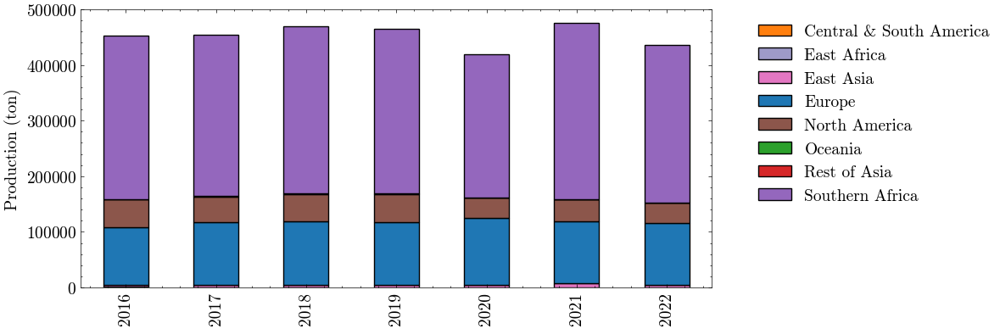

Mine production by region for bauxite (2016-2022)


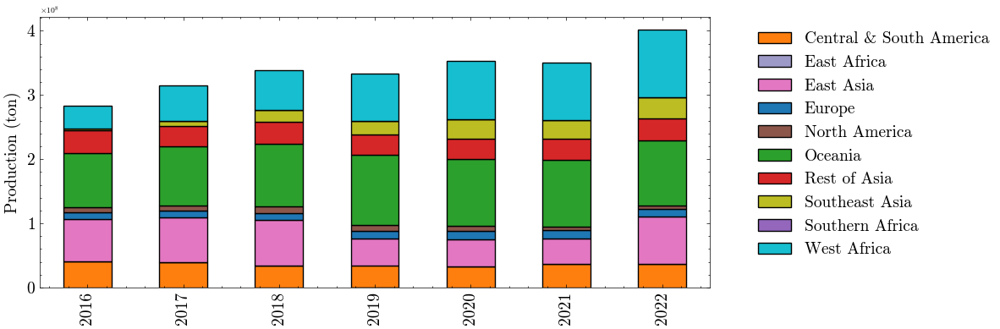

Mine production by region for cobalt (2016-2022)


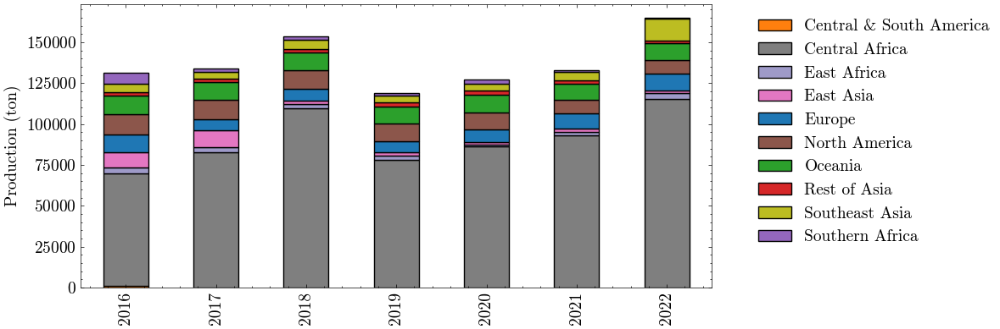

Mine production by region for copper (2016-2022)


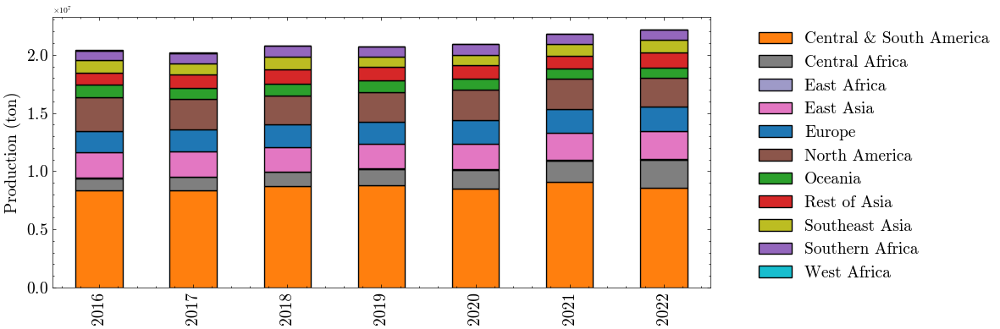

Mine production by region for graphite (2016-2022)


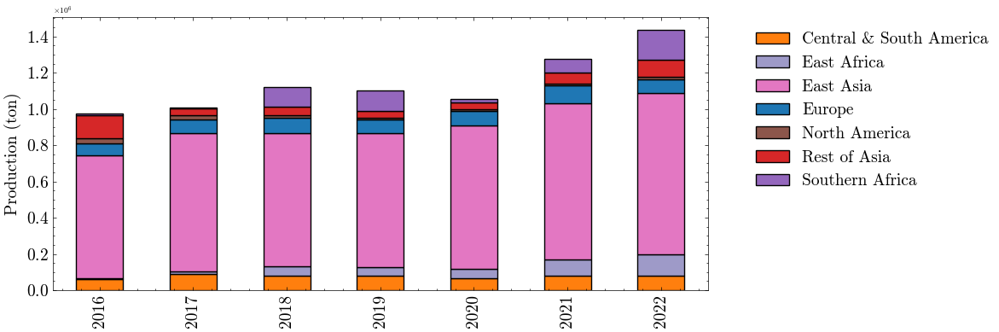

Mine production by region for lead (2016-2022)


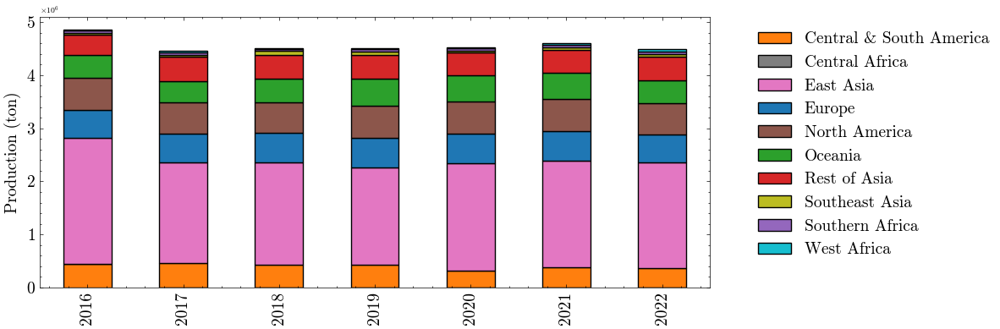

Mine production by region for lithium (2016-2022)


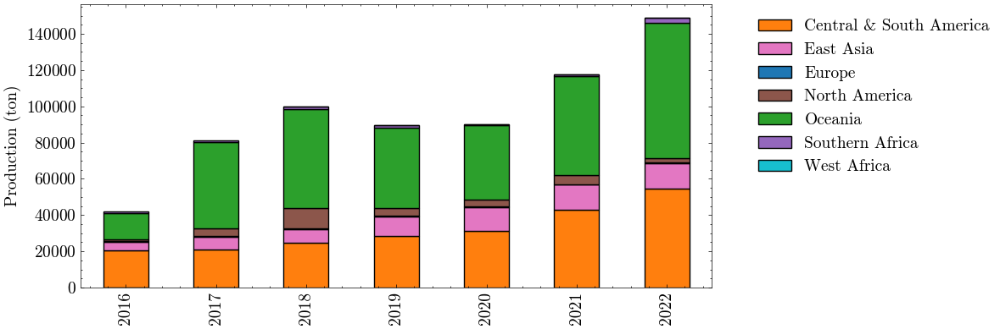

Mine production by region for manganese (2016-2022)


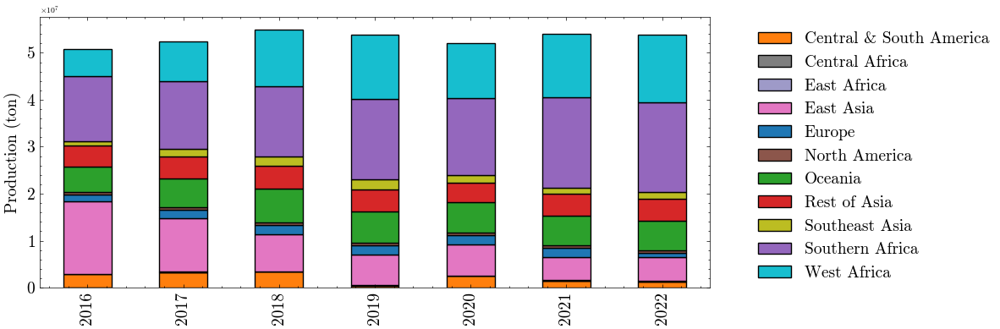

Mine production by region for molybdenum (2016-2022)


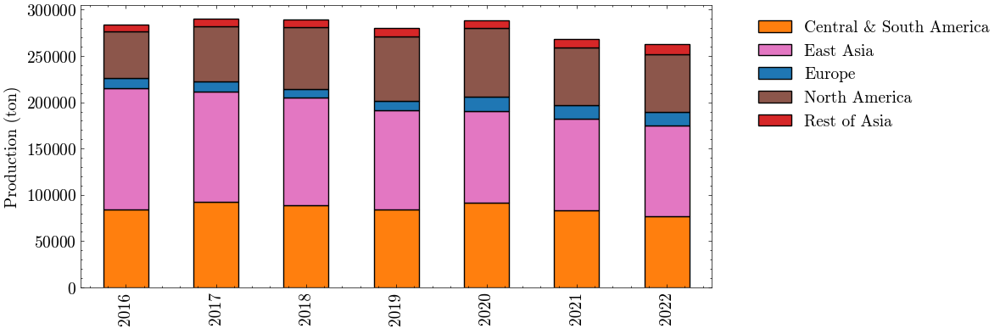

Mine production by region for nickel (2016-2022)


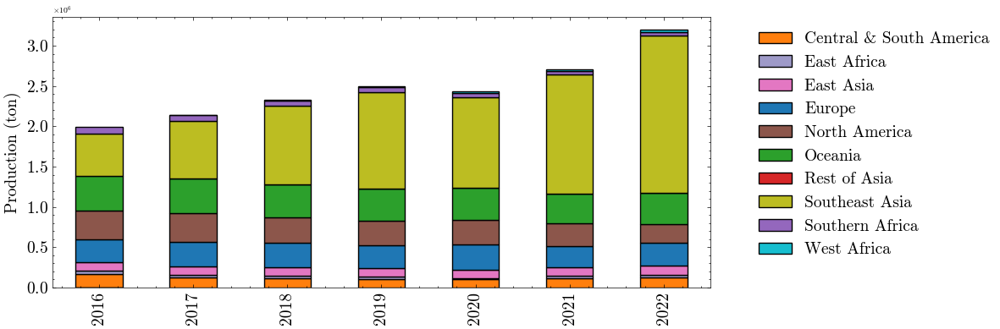

Mine production by region for uranium (2016-2022)


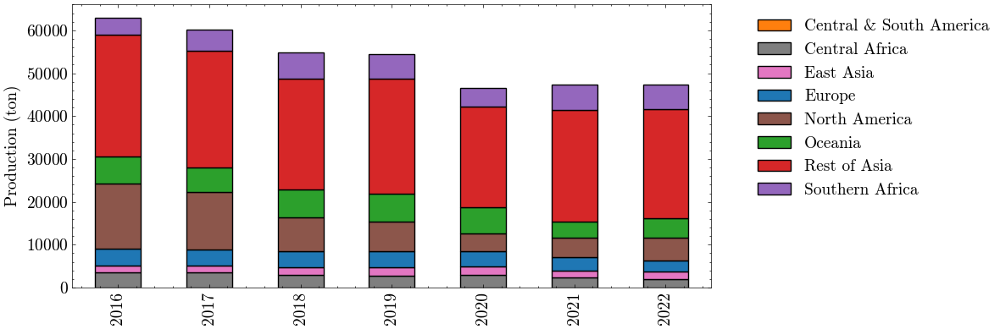

Mine production by region for vanadium (2016-2022)


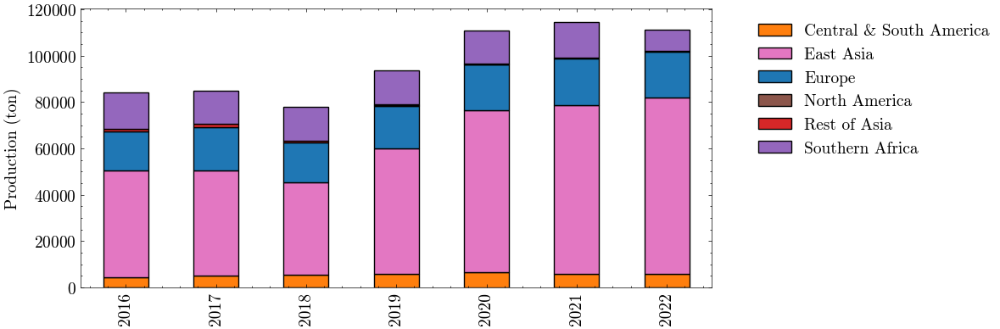

In [7]:
for i in production2['metal'].unique():
    temp = production2[production2['metal']==i]
    stacked_data = temp.pivot_table(
        index='year',
        columns='region',
        values='production',
        aggfunc='sum'
    ).fillna(0)
    
    color_dict = {
        'Europe': '#1f77b4',
        'Central & South America': '#ff7f0e', 
        'Oceania': '#2ca02c',  
        'Rest of Asia': '#d62728',  
        'Southern Africa': '#9467bd',  
        'North America': '#8c564b', 
        'East Asia': '#e377c2', 
        'Central Africa': '#7f7f7f', 
        'Southeast Asia': '#bcbd22', 
        'West Africa': '#17becf',
        'East Africa': '#9e9ac8', 
        'North Africa': '#ff9896'
    }
    colors = [color_dict[region] for region in stacked_data.columns]
    
    f, axe = plt.subplots(1, 1, figsize=(12, 4))  # Set a larger figure size for better visibility
    
    t = stacked_data.plot(
        kind='bar',
        stacked=True,
        ax=axe,
        cmap='tab20',
        color=colors,
        edgecolor='black'
    )
    
#     t = plt.title("Mine production by Region for %s (2016-2022)"%i, fontsize=16, weight='bold')
    print("Mine production by region for %s (2016-2022)"%i)
    t = plt.ylabel("Production (ton)", fontsize=14)
    t = plt.xlabel("", fontsize=14)
    t = axe.tick_params(axis='both', labelsize=14)
    
    t = plt.legend(title="", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    t = plt.tight_layout()
    plt.show()


In [8]:
stat = production2[production2['year']==2016].groupby(['metal'])[['production']].sum().reset_index()
production2 = pd.merge(production2, stat, on='metal')
production2['production_intensity'] = production2['production_x'] / production2['production_y']
production_resv = production2.copy()


Text(0, 0.5, '')

Text(0.5, 0, 'Mining activity intensity')

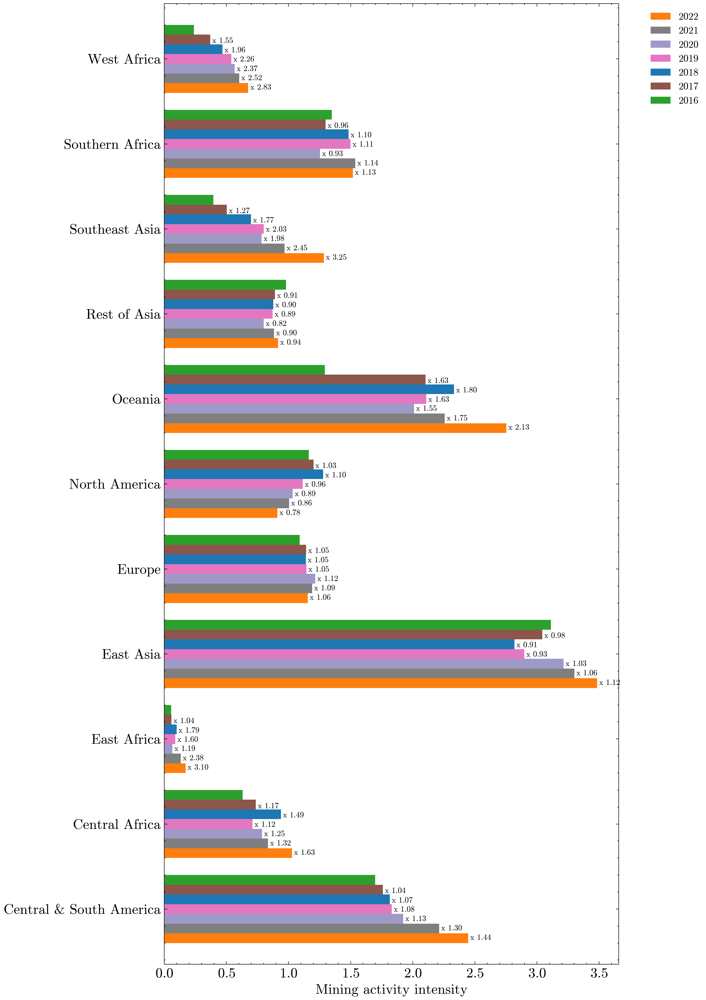

In [9]:
temp = production2.groupby(['year', 'region'])[['production_intensity']].sum().reset_index()
stacked_data = temp.pivot_table(
    index='region',
    columns='year',
    values='production_intensity',
    aggfunc='sum'
).fillna(0)[range(2022, 2015, -1)]

# Calculate the 2016 production values for each region
production_2016 = stacked_data[2016]

# Calculate the relative change (ratio) for each year relative to 2016
relative_change = stacked_data.div(production_2016, axis=0)

# Define color dictionary for regions
color_dict = {
    'Europe': '#1f77b4',  # 蓝色
    'Central & South America': '#ff7f0e',  # 橙色
    'Oceania': '#2ca02c',  # 绿色
    'Rest of Asia': '#d62728',  # 红色
    'Southern Africa': '#9467bd',  # 紫色
    'North America': '#8c564b',  # 棕色
    'East Asia': '#e377c2',  # 粉色
    'Central Africa': '#7f7f7f',  # 灰色
    'Southeast Asia': '#bcbd22',  # 黄绿色
    'West Africa': '#17becf',  # 蓝绿色
    'East Africa': '#9e9ac8',  # 淡紫色
    'North Africa': '#ff9896'   # 浅红色
}
colors = [color_dict[region] for region in stacked_data.index]

# Create bar chart

f, axe = plt.subplots(1, 1, figsize=(10, 14), dpi=300)  # Set a larger figure size for better visibility
ax = stacked_data.plot(
    kind='barh',
    width=0.8,
    stacked=False,
    ax=axe,
    cmap='tab20',
    color=colors,
    edgecolor=None  # Optional: Remove edge lines if you don't want them
)

# Add title and axis labels
# plt.title("Mine Production by Region for %s (2016-2022)" % i, fontsize=16, weight='bold')
plt.ylabel("", fontsize=14)
plt.xlabel("Mining activity intensity", fontsize=14)
t = axe.tick_params(axis='both', labelsize=14)

# Add legend and adjust position
plt.legend(title="", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Annotate bars with relative change (compared to 2016)
for region_idx, region in enumerate(stacked_data.index):
    for year_idx, year in enumerate(stacked_data.columns):
        if year != 2016:  # Don't annotate for 2016, since it's the base year
            value = stacked_data.loc[region, year]
            ratio = relative_change.loc[region, year]
            # Annotate the bars with the relative change (multiplied by the respective value)
            t = ax.text(value+0.1, region_idx+year_idx*0.11-0.38, f'x {ratio:.2f}', ha='center', va='bottom', fontsize=8, color='black')

# Adjust layout for better presentation
plt.tight_layout()

# Show the plot
plt.show()


In [10]:
production1 = pd.read_excel('/Users/linzipeng/Documents/IUE/2_Resource_and_mining/data/SP/金属数据导出/production/production1.xls',
             skiprows=3)
production1.iloc[1] = production1.iloc[1].map(lambda x: str(x).split('|')[-1])
production1.columns = production1.columns[:3].tolist() + [production1.columns[i]+'_'+production1.iloc[1][i] for i in range(3, production1.shape[1])]
production1.columns = [i.lower() for i in production1.columns]
production1 = production1.iloc[2:]


production2 = pd.read_excel('/Users/linzipeng/Documents/IUE/2_Resource_and_mining/data/SP/金属数据导出/production/production2.xls',
             skiprows=3)
production2.iloc[1] = production2.iloc[1].map(lambda x: str(x).split('|')[-1])
production2.columns = production2.columns[:3].tolist() + [production2.columns[i]+'_'+production2.iloc[1][i] for i in range(3, production2.shape[1])]
production2.columns = [i.lower() for i in production2.columns]
production2 = production2.iloc[2:]


production3 = pd.read_excel('/Users/linzipeng/Documents/IUE/2_Resource_and_mining/data/SP/金属数据导出/production/production3.xls',
             skiprows=3)
production3.iloc[1] = production3.iloc[1].map(lambda x: str(x).split('|')[-1])
production3.columns = production3.columns[:3].tolist() + [production3.columns[i]+'_'+production3.iloc[1][i] for i in range(3, production3.shape[1])]
production3.columns = [i.lower() for i in production3.columns]
production3 = production3.iloc[2:]


production = pd.merge(production1, production2, how='outer')
production = pd.merge(production, production3, how='outer')
production = production.dropna(subset=[i for i in production.columns if i not in ['prop_name', 'prop_id', 'primary_commodity']],
                               how='all')
production = production.set_index(['prop_name', 'prop_id', 'primary_commodity']).stack().reset_index()
production['level_3'] = production['level_3'].map(lambda x: str(x).split('_')[-1])
production.columns = ['prop_name', 'prop_id', 'primary_commodity', 'commodity', 'production']

stat = production.groupby('commodity')['production'].sum().reset_index()
stat.columns = ['commodity', 'production_all']
production = pd.merge(production, stat, how='left')
production['production_r'] = production['production'] / production['production_all']
production.head()



,prop_name,prop_id,primary_commodity,commodity,production,production_all,production_r
0,AS Suk,36736.0,Gold,gold,42000,77980182,0.000539
1,Abagong,82144.0,Iron Ore,iron ore,75000,2059993654,0.000036
2,Acupan,26779.0,Gold,gold,10685,77980182,0.000137
3,Ad Duwayhi,34538.0,Gold,gold,120570,77980182,0.001546
4,Ada Tepe,31290.0,Gold,gold,132964,77980182,0.001705


## Event-to-Mine Site Distances

<Figure size 1000x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Distribution of Event-to-Mine Site Distances')

Text(0.5, 0, 'Distance (km)')

Text(0, 0.5, 'Frequency')

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(-20.0, 0, '$\\mathdefault{−20}$'),
  Text(0.0, 0, '$\\mathdefault{0}$'),
  Text(20.0, 0, '$\\mathdefault{20}$'),
  Text(40.0, 0, '$\\mathdefault{40}$'),
  Text(60.0, 0, '$\\mathdefault{60}$'),
  Text(80.0, 0, '$\\mathdefault{80}$'),
  Text(100.0, 0, '$\\mathdefault{100}$'),
  Text(120.0, 0, '$\\mathdefault{120}$')])

(array([     0.,  20000.,  40000.,  60000.,  80000., 100000., 120000.]),
 [Text(0, 0.0, '$\\mathdefault{0}$'),
  Text(0, 20000.0, '$\\mathdefault{20000}$'),
  Text(0, 40000.0, '$\\mathdefault{40000}$'),
  Text(0, 60000.0, '$\\mathdefault{60000}$'),
  Text(0, 80000.0, '$\\mathdefault{80000}$'),
  Text(0, 100000.0, '$\\mathdefault{100000}$'),
  Text(0, 120000.0, '$\\mathdefault{120000}$')])

Text(52, 92439.90000000001, 'Threshold: 50 km')

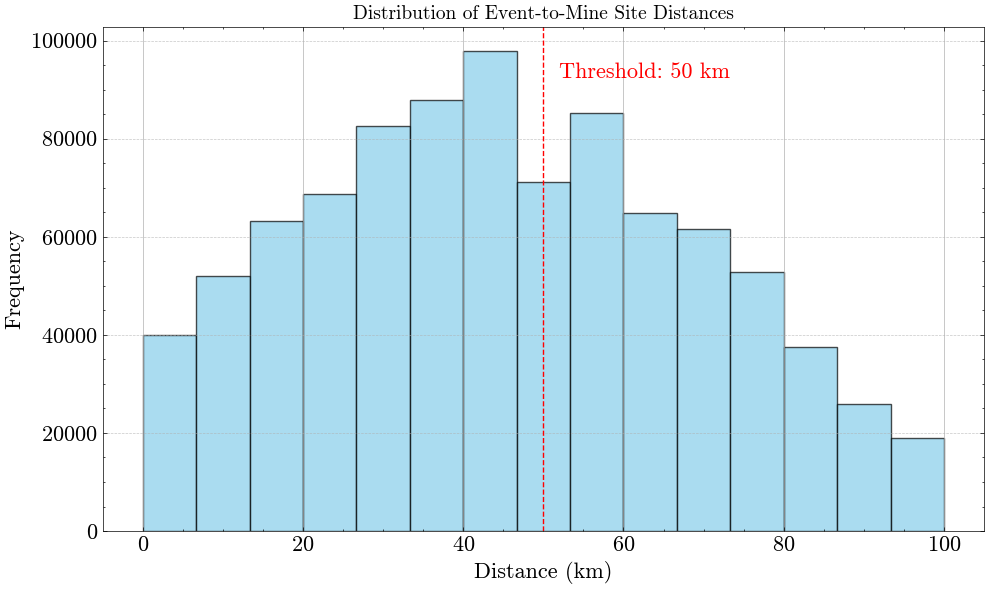

In [11]:
import matplotlib.pyplot as plt

# Create the histogram with enhanced styling
plt.figure(figsize=(10, 6))  # Set a larger figure size for better visibility

# Plot the histogram
df.drop_duplicates(['prop_id', 'GLOBALEVENTID', 'GKGRECORDID'])['Dist'].hist(bins=15, color='skyblue', edgecolor='black', alpha=0.7)
# df.drop_duplicates(['GLOBALEVENTID'])['Dist'].hist(bins=15, color='skyblue', edgecolor='black', alpha=0.7)

# Add labels and title
plt.title('Distribution of Event-to-Mine Site Distances', fontsize=14, weight='bold')
plt.xlabel('Distance (km)', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Add grid lines for better reference
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add annotations for clarity (e.g., mean distance)
plt.axvline(50, color='red', linestyle='dashed', linewidth=1)
plt.text(50 + 2, plt.ylim()[1] * 0.9, f'Threshold: 50 km', color='red', fontsize=16)

# Show the plot
plt.tight_layout()  # Adjust layout to avoid label cutoff
plt.show()


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='dist_bin'>

Text(0.5, 1.0, 'Changes in Sentiment (AvgTone) with Distance from Mine Sites')

Text(0.5, 0, 'Distance to Mine Site (km)')

Text(0, 0.5, 'Average Sentiment (AvgTone)')

([<matplotlib.axis.XTick at 0x7fd68852f670>,
 [Text(0, 0, '(0, 10]'),
  Text(1, 0, '(10, 20]'),
  Text(2, 0, '(20, 30]'),
  Text(3, 0, '(30, 40]'),
  Text(4, 0, '(40, 50]'),
  Text(5, 0, '(50, 60]'),
  Text(6, 0, '(60, 70]'),
  Text(7, 0, '(70, 80]'),
  Text(8, 0, '(80, 90]'),
  Text(9, 0, '(90, 100]')])

(array([-1.72, -1.7 , -1.68, -1.66, -1.64, -1.62, -1.6 , -1.58, -1.56,
        -1.54]),
 [Text(0, -1.72, '$\\mathdefault{−1.72}$'),
  Text(0, -1.7, '$\\mathdefault{−1.70}$'),
  Text(0, -1.68, '$\\mathdefault{−1.68}$'),
  Text(0, -1.66, '$\\mathdefault{−1.66}$'),
  Text(0, -1.64, '$\\mathdefault{−1.64}$'),
  Text(0, -1.6199999999999999, '$\\mathdefault{−1.62}$'),
  Text(0, -1.6, '$\\mathdefault{−1.60}$'),
  Text(0, -1.58, '$\\mathdefault{−1.58}$'),
  Text(0, -1.56, '$\\mathdefault{−1.56}$'),
  Text(0, -1.54, '$\\mathdefault{−1.54}$')])

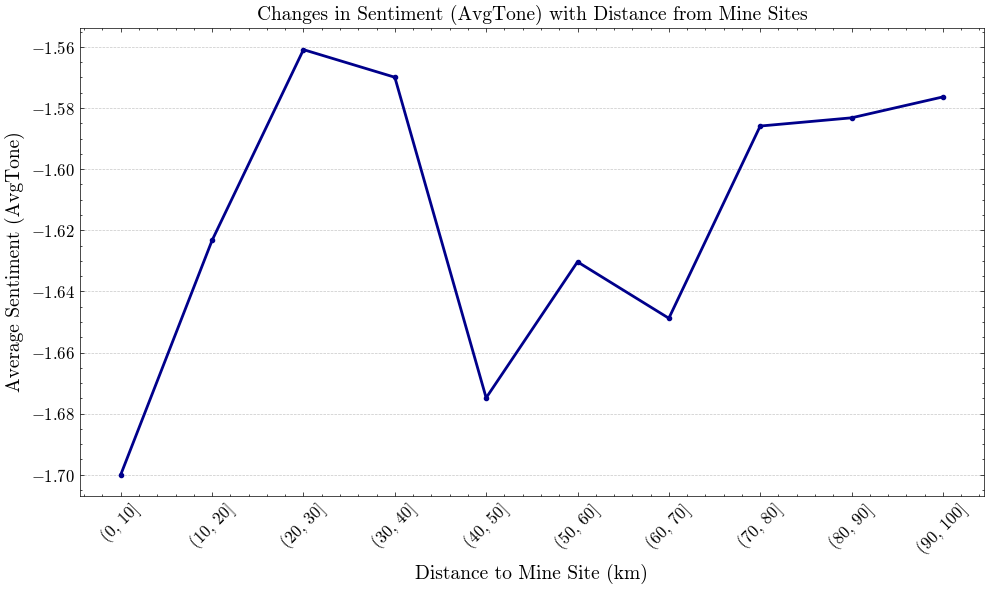

In [12]:
import matplotlib.pyplot as plt
import pandas as pd

df['dist_bin'] = pd.cut(df['Dist'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
avg_tone_by_dist = df.drop_duplicates(['prop_id', 'GLOBALEVENTID', 'GKGRECORDID']).groupby('dist_bin')['AvgTone'].mean()
plt.figure(figsize=(10, 6))
avg_tone_by_dist.plot(color='darkblue', marker='o', linestyle='-', linewidth=2)
plt.title('Changes in Sentiment (AvgTone) with Distance from Mine Sites', fontsize=14, weight='bold')
plt.xlabel('Distance to Mine Site (km)', fontsize=14)
plt.ylabel('Average Sentiment (AvgTone)', fontsize=14)
xticks_labels = avg_tone_by_dist.index.categories.astype(str)
plt.xticks(range(len(xticks_labels)), xticks_labels, fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [13]:
df.shape
df = df[(df['Dist']<=50)]
df.shape


(4363142, 19)

(2513330, 19)

In [14]:
df = pd.merge(df, production, on=['prop_name', 'prop_id', 'primary_commodity'], how='left')
df.loc[df['commodity'].isnull(), 'commodity'] = df.loc[df['commodity'].isnull(), 'primary_commodity']
df['production'] = df['production'].replace(0, np.nan)
df['production_r'] = df['production_r'].replace(0, np.nan)
df.shape


(2563661, 23)

## ETM

In [15]:
ETMs = [
       'Copper', 'Lead', 
       'Palladium', 'Platinum', 'Platinum Group Metals',
       'Nickel', 'Vanadium',
       'Cobalt', 'Lithium',
       'Graphite', 'Manganese', 'Molybdenum',
       'Bauxite',# 'Alumina', 'Aluminum',
       'Chromium',
       'U3O8',
#        'Lanthanides',
       'Antimony'
        ]

df['is_ETM'] = (df['commodity'].isin([i.lower() for i in ETMs])).astype(int)
df['is_ETM'].value_counts()
df['commodity'] = df['commodity'].replace({'palladium':'PGM',
                                           'platinum':'PGM',
                                           'u3o8':'uranium',
                                          })
# df = df[df['is_ETM']==1]


is_ETM
0    2494460
1      69201
Name: count, dtype: int64

In [16]:
df['commodity'] = df['commodity'].replace({
                    'alumina': 'Alumina',
                    'aluminum': 'Aluminum',
                    'antimony': 'Antimony',
                    'bauxite': 'Bauxite',
                    'chromite': 'Chromite',
                    'chromium': 'Chromium',
                    'coal': 'Coal',
                    'cobalt': 'Cobalt',
                    'copper': 'Copper',
                    'diamonds': 'Diamonds',
                    'ferrochrome': 'Ferrochrome',
                    'ferromanganese': 'Ferromanganese',
                    'ferronickel': 'Ferronickel',
                    'ferrotungsten': 'Ferrotungsten',
                    'ferrovanadium': 'Ferrovanadium',
                    'gold': 'Gold',
                    'graphite': 'Graphite',
                    'heavy mineral sands': 'Heavy Mineral Sands',
                    'ilmenite': 'Ilmenite',
                    'iron ore': 'Iron Ore',
                    'lanthanides': 'Lanthanides',
                    'lead': 'Lead',
                    'lithium': 'Lithium',
                    'manganese': 'Manganese',
                    'molybdenum': 'Molybdenum',
                    'nickel': 'Nickel',
                    'niobium': 'Niobium',
                    'palladium': 'Palladium',
                    'phosphate': 'Phosphate',
                    'platinum': 'Platinum',
                    'platinum group metals': 'Platinum Group Metals',
                    'potash': 'Potash',
                    'rutile': 'Rutile',
                    'scandium': 'Scandium',
                    'silver': 'Silver',
                    'tantalum': 'Tantalum',
                    'tin': 'Tin',
                    'titanium': 'Titanium',
                    'tungsten': 'Tungsten',
                    'u3o8': 'U3O8',
                    'vanadium': 'Vanadium',
                    'zinc': 'Zinc',
                    'zircon': 'Zircon',
                    'uranium':'Uranium'
                })


In [17]:
df[(df['is_ETM']==1) & (df['Dist']<=50)].drop_duplicates(subset=['prop_id']).groupby(['commodity'])['production'].sum()


commodity
Bauxite       153470701.0
Cobalt            74310.0
Copper         12733563.0
Graphite          72000.0
Lead            1163838.0
Lithium          468822.0
Manganese      37622235.0
Molybdenum        38094.0
Nickel           208396.0
PGM             3441380.0
Uranium        35255799.0
Vanadium          21707.0
Name: production, dtype: float64

In [18]:
df[(df['is_ETM']==1) & (df['Dist']<=50)].groupby(['commodity'])['prop_id'].nunique().to_frame()


,prop_id
commodity,
Bauxite,18
Cobalt,20
Copper,289
Graphite,1
Lead,135
Lithium,13
Manganese,20
Molybdenum,41
Nickel,48


## theme and category

In [19]:
water_theme_dic = {
'natural_disaster_flood_warning':'Flooding and Excess Water',
'natural_disaster_flooded_areas':'Flooding and Excess Water',
'natural_disaster_torrential_rainfall':'Flooding and Excess Water',
'natural_disaster_flash_floods':'Flooding and Excess Water',
'natural_disaster_intense_rainfall':'Flooding and Excess Water',
'natural_disaster_flash_flood':'Flooding and Excess Water',
'natural_disaster_floodwaters':'Flooding and Excess Water',
'natural_disaster_floodwater':'Flooding and Excess Water',
'natural_disaster_floods':'Flooding and Excess Water',
'natural_disaster_flood_waters':'Flooding and Excess Water',
'natural_disaster_flooded':'Flooding and Excess Water',
'natural_disaster_flooding':'Flooding and Excess Water',
'natural_disaster_flood':'Flooding and Excess Water',
'natural_disaster_flood_water':'Flooding and Excess Water',
'natural_disaster_high_waters':'Flooding and Excess Water',
'natural_disaster_water_level':'Flooding and Excess Water',
'natural_disaster_high_water':'Flooding and Excess Water',
'natural_disaster_desertification':'Drought and Desertification',
'natural_disaster_droughts':'Drought and Desertification',
'natural_disaster_drought':'Drought and Desertification',
'wb_2981_drinking_water_quality_standards':'Water Quality and Pollution',
'wb_1798_water_pollution':'Water Quality and Pollution',
'wb_1215_water_quality_standards':'Water Quality and Pollution',
'wb_991_drainage_water_quality':'Water Quality and Pollution',
'wb_2009_water_quality_monitoring':'Water Quality and Pollution',
'wb_150_wastewater_reuse':'Water Supply, Sanitation and Infrastructure',
'crisislex_c06_water_sanitation':'Water Supply, Sanitation and Infrastructure',
'wb_149_wastewater_treatment_and_disposal':'Water Supply, Sanitation and Infrastructure',
'wb_2005_community_water_supply_management':'Water Supply, Sanitation and Infrastructure',
'wb_138_water_supply':'Water Supply, Sanitation and Infrastructure',
'wb_1778_freshwater_ecosystems':'Water Supply, Sanitation and Infrastructure',
'wb_139_sanitation_and_wastewater':'Water Supply, Sanitation and Infrastructure',
'wb_143_rural_water':'Water Supply, Sanitation and Infrastructure',
'wb_3014_wastewater_disposal_facilities':'Water Supply, Sanitation and Infrastructure',
'wb_1462_water_sanitation_and_hygiene':'Water Supply, Sanitation and Infrastructure',
'wb_1199_water_supply_and_sanitation':'Water Supply, Sanitation and Infrastructure',
'wb_2008_water_treatment':'Water Supply, Sanitation and Infrastructure',
'wb_1063_water_allocation_and_water_supply':'Water Supply, Sanitation and Infrastructure',
'wb_154_flood_protection':'Water Supply, Sanitation and Infrastructure',
'wb_144_urban_water':'Water Economics, Policy and Management',
'wb_1998_water_economics':'Water Economics, Policy and Management',
'wb_427_water_allocation_and_water_economics':'Water Economics, Policy and Management',
'wb_1064_water_demand_management':'Water Economics, Policy and Management',
'wb_1729_urban_water_financial_sustainability':'Water Economics, Policy and Management',
'wb_1731_non_revenue_water':'Water Economics, Policy and Management',
'wb_2971_water_pricing':'Water Economics, Policy and Management',
'water_security':'Water Economics, Policy and Management',
'wb_159_transboundary_water':'Water Economics, Policy and Management',
'wb_2007_water_safety_plans':'Water Economics, Policy and Management',
'wb_2992_freshwater_fisheries':'Water Economics, Policy and Management',
'wb_1021_water_law':'Water Economics, Policy and Management',
'wb_1000_water_management_structures':'Water Economics, Policy and Management',
'wb_141_water_resources_management':'Water Economics, Policy and Management',
'wb_140_agricultural_water_management':'Water Economics, Policy and Management',
'wb_156_groundwater_management':'Water Economics, Policy and Management',
'wb_155_watershed_management':'Water Economics, Policy and Management',
'wb_1220_surface_water_management':'Water Economics, Policy and Management',
'wb_1002_irrigation_water_quality':'Water Supply, Sanitation and Infrastructure'}

df['category'] = df['V2Themes_lst'].map(lambda x: x.lower()).replace(water_theme_dic)
df = df[df['category']!='wb_137_water']


<Axes: xlabel='category', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0.5, 0, 'Drought and Desertification'),
  Text(1.5, 0, 'Flooding and Excess Water'),
  Text(2.5, 0, 'Water Quality and Pollution'),
  Text(3.5, 0, 'Water Economics, Policy and Management'),
  Text(4.5, 0, 'Water Supply, Sanitation and Infrastructure')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Quality and Pollution'),
  Text(0, 3.5, 'Water Economics, Policy and Management'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 41.249999999999986, '')

Text(54.74999999999996, 0.5, '')

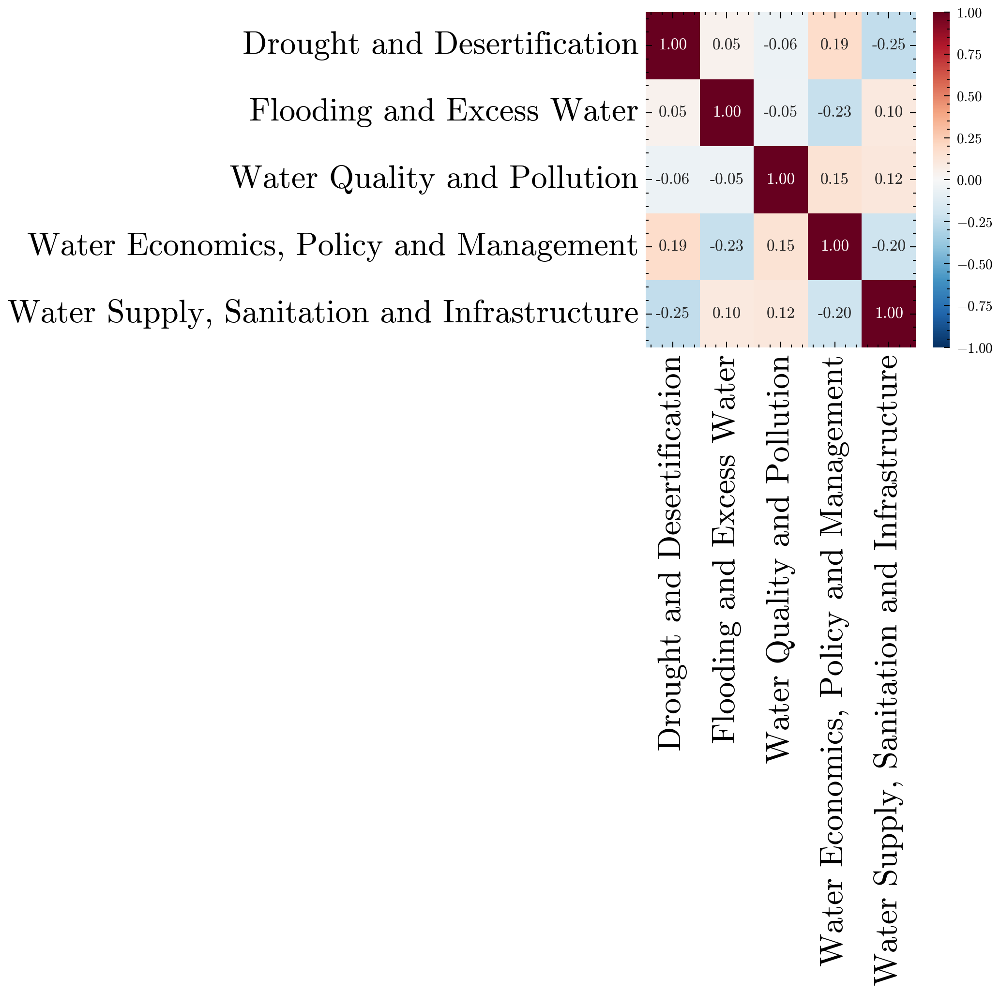

In [20]:
stat = df[(df['is_ETM']==1)].drop_duplicates(subset=['GLOBALEVENTID', 'category']).set_index([
          'GLOBALEVENTID', 'category'])['is_ETM'].unstack() 
stat['total'] = stat.sum(axis=1)
stat = stat[stat['total']>0]
del stat['total']
stat = stat.fillna(0)

f, axes = plt.subplots(1, 1, figsize=(3, 3), dpi=300)
hm = stat[['Drought and Desertification', 'Flooding and Excess Water', 'Water Quality and Pollution']].corr()
hm = stat[['Drought and Desertification', 'Flooding and Excess Water', 'Water Quality and Pollution', 
          'Water Economics, Policy and Management', 'Water Supply, Sanitation and Infrastructure']].corr()
sns.heatmap(hm, cmap='RdBu_r', vmin=-1, vmax=1, annot=True, fmt=".2f", annot_kws={'fontsize':8})
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)#, horizontalalignment='left')
plt.xlabel('')
plt.ylabel('')


## other features

In [21]:
stage_dic = {'Grassroots':'Exploration-stage',
            'Exploration':'Exploration-stage',
            'Target Outline':'Exploration-stage',
            'Advanced Exploration':'Exploration-stage',
            'Prefeas/Scoping':'Exploration-stage',
            'Feasibility Started':'Feasibility-stage',
            'Feasibility':'Feasibility-stage',
            'Feasibility Complete':'Development-stage',
            'Reserves Development':'Development-stage',
            'Satellite':'Development-stage',
            'Construction Planned':'Development-stage',
            'Construction Started':'Development-stage',
            'Commissioning':'Development-stage',
            'Preproduction':'Development-stage',
            'Operating':'Operating-stage',
            'Limited Production':'Operating-stage',
            'Expansion':'Operating-stage',
            'Closed':'Closed-stage'}
df['current_stage'] = df['dev_stage'].map(stage_dic)


In [22]:
country_to_region = {
    'South Africa': 'Southern Africa',
    'Russia': 'Europe',  # Mainly considered European in a geopolitical context
    'Ukraine': 'Europe',
    'Brazil': 'Central & South America',
    'China': 'East Asia',
    'Bosnia & Herzegovina': 'Europe',
    'Singapore': 'Southeast Asia',
    'Canada': 'North America',
    'USA': 'North America',
    'Finland': 'Europe',
    'Niue': 'Oceania',
    'Austria': 'Europe',
    'France': 'Europe',
    'Germany': 'Europe',
    'Zimbabwe': 'Southern Africa',
    'Belgium': 'Europe',
    'Slovakia': 'Europe',
    'Portugal': 'Europe',
    'Venezuela': 'Central & South America',
    'Australia': 'Oceania',
    'India': 'Rest of Asia',
    'Greece': 'Europe',
    'Bahrain': 'Rest of Asia',
    'Italy': 'Europe',
    'Tunisia': 'West Africa',
    'Netherlands': 'Europe',
    'Poland': 'Europe',
    'United Arab Emirates': 'Rest of Asia',
    'United Kingdom': 'Europe',
    'Chile': 'Central & South America',
    'Jamaica': 'North America',
    'Norway': 'Europe',
    'Mexico': 'North America',
    'Japan': 'East Asia',
    'Armenia': 'Rest of Asia',
    'Turkey': 'Rest of Asia',
    'Albania': 'Europe',
    'Zambia': 'Southern Africa',
    'Serbia': 'Europe',
    'Hong Kong, China': 'East Asia',
    'Dem. Rep. Congo': 'Central Africa',
    'North Macedonia': 'Europe',
    'Malaysia': 'Southeast Asia',
    'Morocco': 'West Africa',
    'Uganda': 'East Africa',
    'Bolivia': 'Central & South America',
    'Peru': 'Central & South America',
    'Nigeria': 'West Africa',
    'Panama': 'Central & South America',
    'Romania': 'Europe',
    'Iran': 'Rest of Asia',
    'Myanmar': 'Southeast Asia',
    'North Korea': 'East Asia',
    'Taiwan, China': 'East Asia',
    'Spain': 'Europe',
    'Indonesia': 'Southeast Asia',
    'Azerbaijan': 'Rest of Asia',
    'Philippines': 'Southeast Asia',
    'Ireland': 'Europe',
    'Eritrea': 'East Africa',
    'Colombia': 'Central & South America',
    'Sierra Leone': 'West Africa',
    'Mali': 'West Africa',
    'Guinea': 'West Africa',
    'Mongolia': 'East Asia',
    'Liberia': 'West Africa',
    'Egypt': 'West Africa',
    'South Korea': 'East Asia',
    'Ghana': 'West Africa',
    'Vietnam': 'Southeast Asia',
    'Botswana': 'Southern Africa',
    'Montenegro': 'Europe',
    'Slovenia': 'Europe',
    'Namibia': 'Southern Africa',
    'Tanzania': 'East Africa',
    'Guyana': 'Central & South America',
    'Dominican Republic': 'North America',
    'Sweden': 'Europe',
    'Cambodia': 'Southeast Asia',
    'Mozambique': 'Southern Africa',
    'Ecuador': 'Central & South America',
    'Laos': 'Southeast Asia',
    'Croatia': 'Europe',
    'Israel': 'Rest of Asia',
    'Haiti': 'North America',
    'Rep. Of the Congo': 'Central Africa',
    'Kyrgyzstan': 'Rest of Asia',
    'Thailand': 'Southeast Asia',
    'Burkina Faso': 'West Africa',
    'New Zealand': 'Oceania',
    'Tajikistan': 'Rest of Asia',
    'Pakistan': 'Rest of Asia',
    'Ethiopia': 'East Africa',
    'Costa Rica': 'Central & South America',
    'Belarus': 'Europe',
    'Sri Lanka': 'Rest of Asia',
    'Fiji': 'Oceania',
    'Uzbekistan': 'Rest of Asia',
    "Cote d'Ivoire": 'West Africa',
    'Kazakhstan': 'Rest of Asia',
    'Algeria': 'West Africa',
    'Argentina': 'Central & South America',
    'Bulgaria': 'Europe',
    'Switzerland': 'Europe',
    'Rwanda': 'East Africa',
    'Iceland': 'Europe',
    'Kenya': 'East Africa',
    'Nicaragua': 'Central & South America',
    'Sudan': 'East Africa',
    'Papua New Guinea': 'Oceania',
    'New Caledonia': 'Oceania',
    'Guatemala': 'Central & South America',
    'Qatar': 'Rest of Asia',
    'Afghanistan': 'Rest of Asia',
    'Saudi Arabia': 'Rest of Asia',
    'Czechia': 'Europe',
    'Georgia': 'Rest of Asia',
    'Madagascar': 'East Africa',
    'Cuba': 'North America',
    'Oman': 'Rest of Asia',
    'Jordan': 'Rest of Asia',
    'Cyprus': 'Europe',
    'Lesotho': 'Southern Africa',
    'Angola': 'Central Africa',
    'Niger': 'West Africa',
    'Malawi': 'East Africa',
    'Honduras': 'Central & South America',
    'Trinidad and Tobago': 'North America',
    'Togo': 'West Africa',
    'El Salvador': 'Central & South America',
    'Brunei': 'Southeast Asia',
    'Mauritania': 'West Africa',
    'Somalia': 'East Africa',
    'Suriname': 'Central & South America',
    'Burundi': 'East Africa',
    'Senegal': 'West Africa',
    'Luxembourg': 'Europe',
    'Turkmenistan': 'Rest of Asia',
    'Eswatini': 'Southern Africa',
    'Hungary': 'Europe',
    'Uruguay': 'Central & South America',
    'Chad': 'Central Africa',
    'Yemen': 'Rest of Asia',
    'French Guiana': 'Central & South America',
    'Nepal': 'Rest of Asia',
    'Solomon Islands': 'Oceania',
    'Gabon': 'Central Africa',
    'Greenland': 'North America',
    'Cameroon': 'Central Africa',
    'Bangladesh': 'Rest of Asia',
    'Andorra': 'Europe',
    'Paraguay': 'Central & South America',
    'Belize': 'Central & South America',
    'Djibouti': 'East Africa',
    'Aruba': 'North America',
    'South Sudan': 'East Africa',
    'Estonia': 'Europe',
    'Equatorial Guinea': 'Central Africa',
    'Vanuatu': 'Oceania',
    'Central African Rep.': 'Central Africa',
    'Guinea-Bissau': 'West Africa',
    'Benin': 'West Africa',
}
df['region'] = df['country_name'].replace(country_to_region)
df['region'].value_counts()


region
North America              1027166
Southern Africa             224287
Central & South America     176752
Europe                      132287
Oceania                     127474
East Asia                   103364
Rest of Asia                 90587
West Africa                  74303
Southeast Asia               67297
East Africa                  15644
Central Africa                4078
Name: count, dtype: int64

In [23]:
df['DATEADDED'] = pd.to_datetime(df['DATEADDED'], format='%Y%m%d')
df['year'] = df['DATEADDED'].map(lambda x: int(str(x)[:4]))
df['year-month'] = df['DATEADDED'].map(lambda x: str(x)[:7])
df['month'] = df['DATEADDED'].map(lambda x: str(x)[5:7]).astype(int)


## statistics

In [24]:
df[df['is_ETM']==1]['GLOBALEVENTID'].nunique()
df[df['is_ETM']==1]['GKGRECORDID'].nunique()
df[df['is_ETM']==1]['prop_id'].nunique()


7122

5832

511

In [25]:
region = pd.read_excel('/Users/linzipeng/Documents/IUE/2_Resource_and_mining/data/SP/cleaned_data/SPGlobal_loc_risk.xlsx')   
production = pd.merge(production, region, on='prop_id')
production['region'] = production['country_name'].replace(country_to_region)
production['has_data'] = (production['prop_id'].isin(df['prop_id'].unique())).astype(int)
production.groupby('region')['has_data'].mean().sort_values()


region
East Asia                  0.380612
Europe                     0.427152
Rest of Asia               0.513889
Central Africa             0.534884
Southeast Asia             0.591398
Oceania                    0.676282
Central & South America    0.707483
North America              0.755796
West Africa                0.852632
East Africa                0.869565
Southern Africa            0.944882
Name: has_data, dtype: float64

# media attention

## temporal

year
2016    1259.000000
2017    1124.000000
2018     837.000000
2019     966.000000
2020     633.000000
2021     675.000000
2022     804.000000
2023     889.714286
Name: GLOBALEVENTID, dtype: float64

<Axes: xlabel='year'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0, 0.5, 'Media attention')

(0.0, 2000.0)

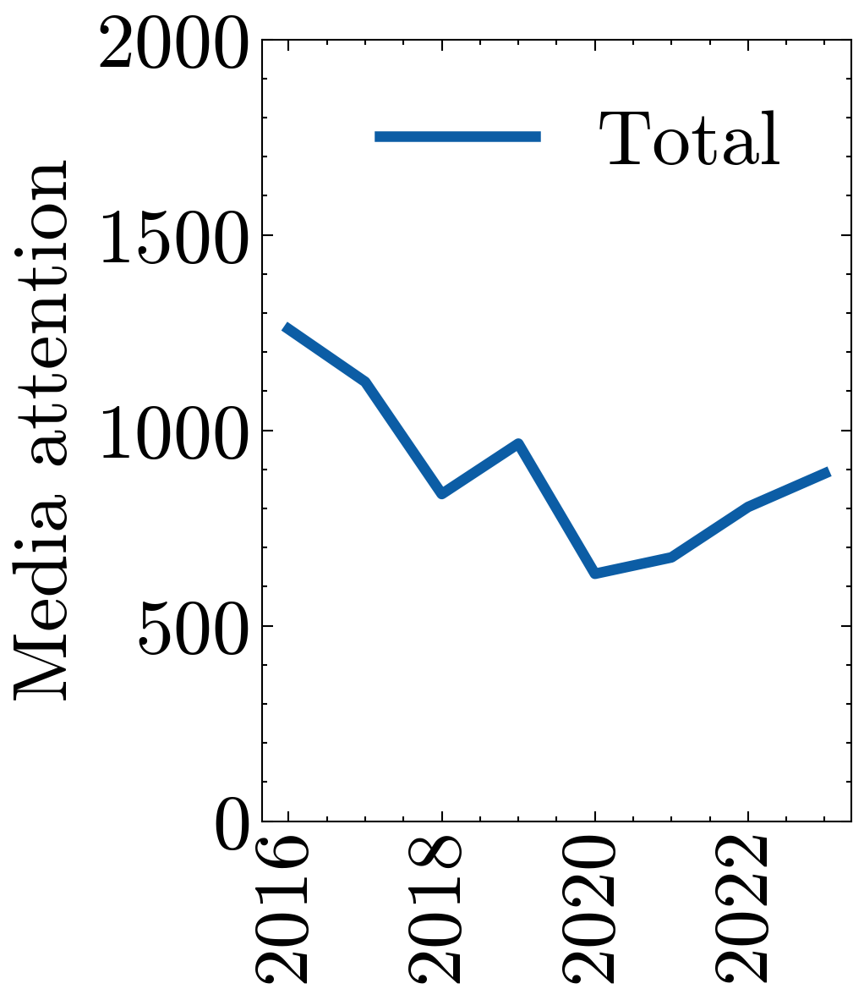

In [26]:
f, axes = plt.subplots(1, 1, figsize=(3, 4), dpi=300)
stat = df[(df['is_ETM']==1)& (df['year-month']>='2016-01')& (df['year-month']<'2023-08')].groupby([
    'year'])['GLOBALEVENTID'].nunique()
stat.loc[2023] /= 7/12
stat
stat.plot(label='Total', ax=axes, linewidth=3)
plt.legend(fontsize=22)
plt.xlabel('')
plt.ylabel('')
plt.ylabel('Media attention', fontsize=22)
t = axes.tick_params(axis='both', labelsize=22)
t = plt.xticks(range(2016, 2024, 2), rotation= 90)
plt.ylim(0, 2000)
plt.show()


[]

Text(0, 0.5, 'Media attention')

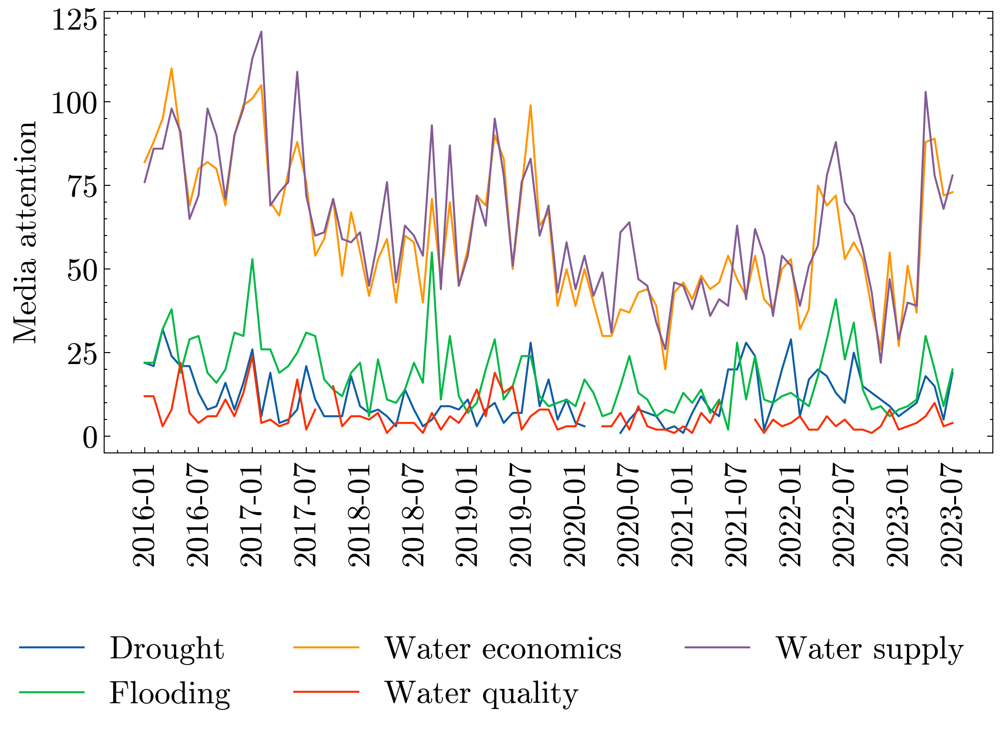

In [30]:
f, axes = plt.subplots(1, 1, figsize=(8, 4), dpi=300)
stat = df[(df['is_ETM']==1) & (df['year-month']>='2016-01') & (df['year-month']<'2023-08')].groupby(['year-month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='4',ax=axes)
stat.plot(label='4', ax=axes)
t = axes.tick_params(axis='both', labelsize=16)
t = plt.xlabel('', fontsize=16)
t = plt.xticks([i for i in [0, 6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90]],
           ['2016-01', '2016-07', '2017-01', '2017-07', '2018-01', '2018-07',
            '2019-01', '2019-07', '2020-01', '2020-07', '2021-01', '2021-07',
            '2022-01', '2022-07', '2023-01', '2023-07'], rotation=90)
plt.ylabel('Media attention', fontsize=16)
t = plt.legend(['Drought', 'Flooding', 'Water economics', 'Water quality', 'Water supply'],
            bbox_to_anchor=(1, -0.35), ncols=3, fontsize=16)
plt.show()


category,Drought and Desertification,Flooding and Excess Water,"Water Economics, Policy and Management",Water Quality and Pollution,"Water Supply, Sanitation and Infrastructure"
month,,,,,
1,108,147,459,62,473
2,61,111,481,55,495
3,106,148,450,34,456
4,94,158,562,46,587
5,72,128,525,72,519
6,89,150,503,56,544
7,103,202,498,29,555
8,119,167,467,37,503
9,79,153,432,31,473


<Axes: xlabel='month'>

Text(0, 0.5, 'Media attention')

Text(0.5, 0, 'Month')

([<matplotlib.axis.XTick at 0x7fd70a6eff70>,
 [Text(2, 0, '$\\mathdefault{2}$'),
  Text(4, 0, '$\\mathdefault{4}$'),
  Text(6, 0, '$\\mathdefault{6}$'),
  Text(8, 0, '$\\mathdefault{8}$'),
  Text(10, 0, '$\\mathdefault{10}$'),
  Text(12, 0, '$\\mathdefault{12}$')])

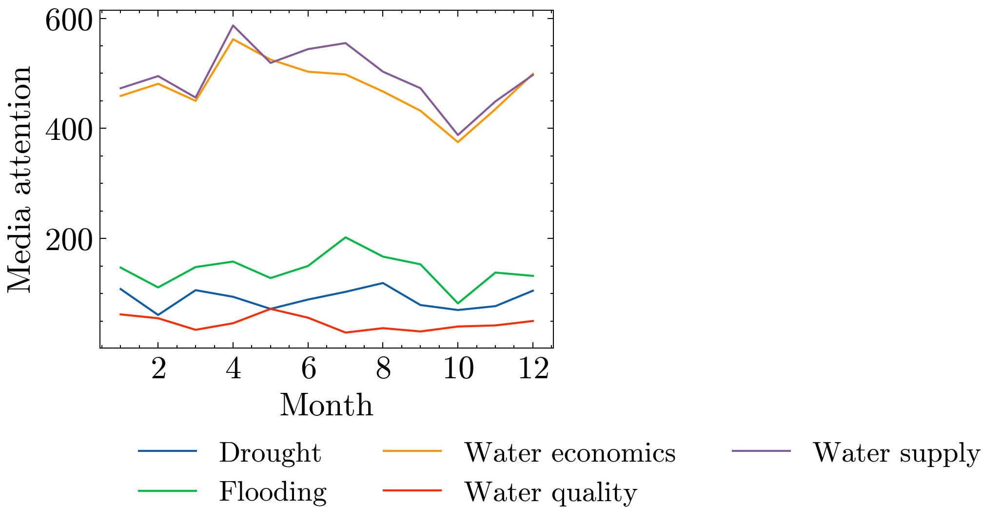

In [31]:
# f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
# df[(df['is_ETM']==0)].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='1', ax=axes)
# plt.legend()
# plt.show()

# f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
# df[(df['is_ETM']==0) & (df['production'].isnull())].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='2', ax=axes)    
# plt.legend()
# plt.show()

# f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
# df[(df['is_ETM']==1) & (df['production']>0)].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='3', ax=axes)
# plt.legend()
# plt.show()

f, axes = plt.subplots(1, 1, figsize=(4, 3), dpi=300)
stat = df[(df['is_ETM']==1)].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack()
stat
stat.plot(label='4', ax=axes)
t = axes.tick_params(axis='both', labelsize=16)
plt.legend(['Drought', 'Flooding', 'Water economics', 'Water quality', 'Water supply'],
            bbox_to_anchor=(2, -0.2), ncols=3, fontsize=14)
plt.ylabel('Media attention', fontsize=16)
plt.xlabel('Month', fontsize=16)
plt.xticks([2, 4, 6, 8, 10, 12], fontsize=16)
plt.show()

# f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
# df[(df['is_ETM']==1) & (df['category'].isin([
#     'Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification'
# ]))].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='4', ax=axes)
# t = axes.tick_params(axis='both', labelsize=12)
# plt.legend(fontsize=12)
# plt.ylim(0, 400)
# plt.ylabel('Media attention', fontsize=12)
# plt.xlabel('Month', fontsize=12)
# plt.show()

# f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
# df[(df['is_ETM']==1) & (-df['category'].isin([
#     'Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification'
# ]))].groupby(['month', 'category'])['GLOBALEVENTID'].nunique().unstack().plot(label='4', ax=axes)
# plt.ylim(0, 900)
# plt.ylabel('Frequency')
# plt.legend()
# plt.show()


## spatial

Water Quality and Pollution
Flooding and Excess Water
Drought and Desertification
Water Economics, Policy and Management
Water Supply, Sanitation and Infrastructure


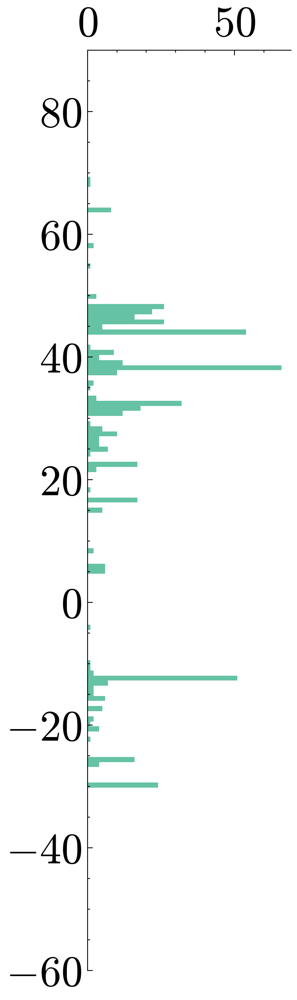

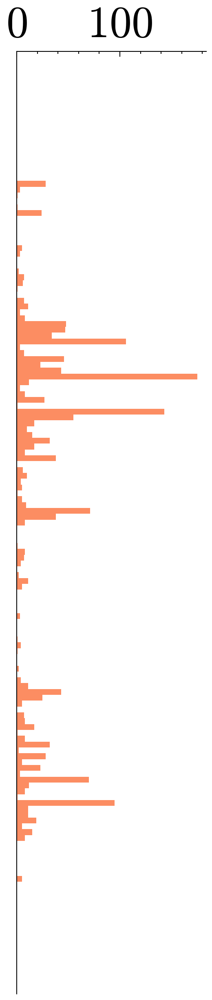

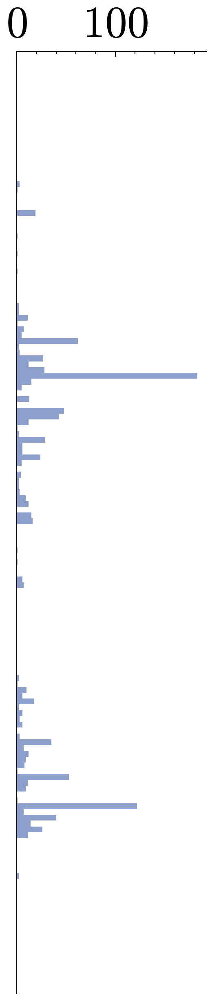

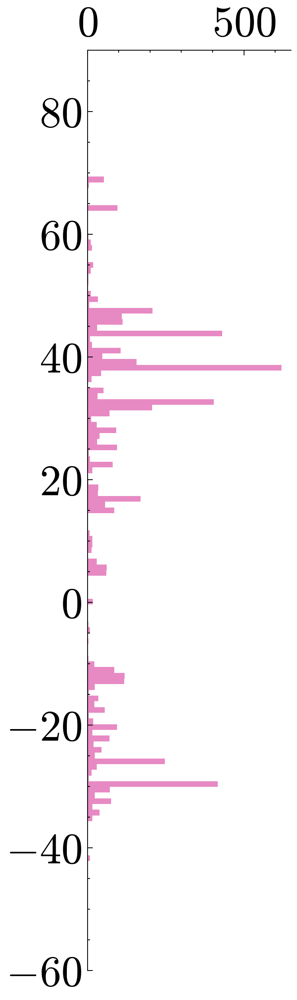

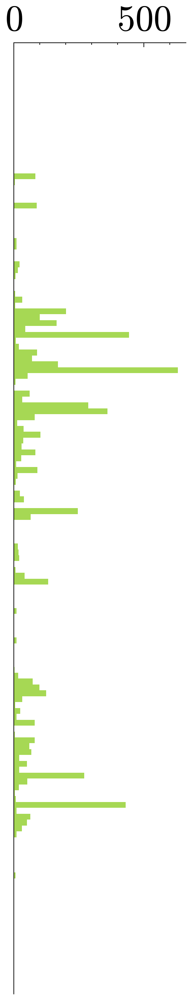

In [32]:
colors = mpl.colorbar.cm.Set2.colors[:5]
color_dic = dict(zip(['Water Quality and Pollution','Flooding and Excess Water','Drought and Desertification',
                      'Water Economics, Policy and Management','Water Supply, Sanitation and Infrastructure'],
                     mpl.colorbar.cm.Set2.colors))


for k, i in enumerate(['Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification',
                      'Water Economics, Policy and Management', 'Water Supply, Sanitation and Infrastructure'
                      ]):
    if (k!=0) & (k!=3):
        f, axs = plt.subplots(1, figsize=(2, 10), dpi=300)
    else:
        f, axs = plt.subplots(1, figsize=(2.2, 10), dpi=300)
        
    print(i)
    temp = df[(df['category']==i) & (df['is_ETM']==1)].drop_duplicates(subset=['GLOBALEVENTID'])
    t = temp['ActionGeo_Lat'].hist(orientation='horizontal', bins=120, ax=axs,
                                   color=colors[k])
    
    t = axs.set_ylim(-60, 90)
    t = axs.set_ylabel('')
    t = axs.tick_params(axis='both', labelsize=26)
    t = axs.legend([], frameon=False)

    t = axs.spines['top'].set_visible(True)
    t = axs.spines['right'].set_visible(False)
    t = axs.spines['bottom'].set_visible(False)
    t = axs.spines['left'].set_visible(True)

    t = axs.yaxis.set_ticks_position('left')
    t = axs.xaxis.set_ticks_position('top')
    if (k!=0) & (k!=3):
        t = axs.set_yticks([])

#     t = axs.set_xlabel('Million', fontsize=20)
    t = axs.grid(False)

t = plt.tight_layout()
t = plt.show()


Water Quality and Pollution
Flooding and Excess Water
Drought and Desertification
Water Economics, Policy and Management
Water Supply, Sanitation and Infrastructure


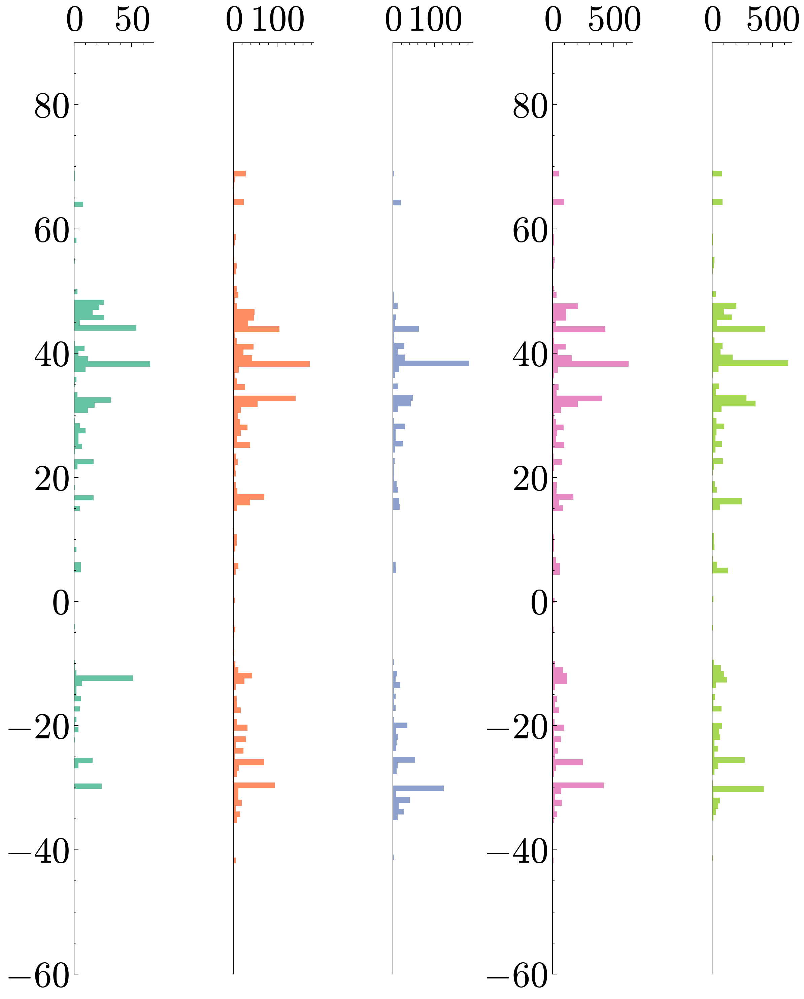

In [33]:
colors = mpl.colorbar.cm.Set2.colors[:5]
color_dic = dict(zip(['Water Quality and Pollution','Flooding and Excess Water','Drought and Desertification',
                      'Water Economics, Policy and Management','Water Supply, Sanitation and Infrastructure'],
                     mpl.colorbar.cm.Set2.colors))

f, axes = plt.subplots(1, len(colors), figsize=(8, 10), dpi=300)
plt.subplots_adjust(left=0, bottom=None, right=None, top=None,
                    wspace=0, hspace=0)

for k, i in enumerate(['Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification',
                      'Water Economics, Policy and Management', 'Water Supply, Sanitation and Infrastructure'
                      ]):
    print(i)
    axs = axes[k]
    temp = df[(df['category']==i) & (df['is_ETM']==1)].drop_duplicates(subset=['GLOBALEVENTID'])
    t = temp['ActionGeo_Lat'].hist(orientation='horizontal', bins=120, ax=axs,
                                   color=colors[k])
    
    t = axs.set_ylim(-60, 90)
    t = axs.set_ylabel('')
    t = axs.tick_params(axis='both', labelsize=26)
    t = axs.legend([], frameon=False)

    t = axs.spines['top'].set_visible(True)
    t = axs.spines['right'].set_visible(False)
    t = axs.spines['bottom'].set_visible(False)
    t = axs.spines['left'].set_visible(True)

    t = axs.yaxis.set_ticks_position('left')
    t = axs.xaxis.set_ticks_position('top')
    if (k!=0) & (k!=3):
        t = axs.set_yticks([])

#     t = axs.set_xlabel('Million', fontsize=20)
    t = axs.grid(False)

t = plt.tight_layout()
t = plt.show()


In [34]:
filtered_df = df[(df['is_ETM']==1) & (df['category'].isin([
#                                              'Water Quality and Pollution',
#                                              'Flooding and Excess Water',
#                                              'Drought and Desertification',
                                             'Water Economics, Policy and Management',
                                             'Water Supply, Sanitation and Infrastructure'
                                             ]))].drop_duplicates(subset=['longitude', 'latitude', 'ActionGeo_Long', 'ActionGeo_Lat'])

fig = go.Figure()

color_dic = dict(zip(['Water Quality and Pollution','Flooding and Excess Water','Drought and Desertification',
                      'Water Economics, Policy and Management','Water Supply, Sanitation and Infrastructure'],
                     px.colors.qualitative.Set2))

fig = go.Figure(data=[
    go.Scattergeo(
        lon=filtered_df[filtered_df['production']>0]['longitude'],
        lat=filtered_df[filtered_df['production']>0]['latitude'],
        mode='markers',
        marker={
#             'size': dat1['production_PROD_Ni_tpa']/20,  
            'symbol': 'triangle-up', 
            'size': 12,
#             'sizemin':6,
            'color': 'lightgrey',#DCDCDC',
            'line': {
                'color': 'black',
                'width': 0.8
            }
        },
    name='Mines with Production'  # Add a name for the legend
    )
])


fig = fig.add_trace(
    go.Scattergeo(
        lon=filtered_df[filtered_df['production'].isnull()]['longitude'],
        lat=filtered_df[filtered_df['production'].isnull()]['latitude'],
        mode='markers',
        marker={
#             'size': dat1['production_PROD_Ni_tpa']/20,
            'symbol': 'triangle-up',  
            'size': 6,
#             'sizemin':6,
            'color': 'lightgrey',#DCDCDC',
            'line': {
                'color': 'black',
                'width': 0.8
            }
        },
    name='Mines without Production'  # Add a name for the legend
    )
)

for category in filtered_df['category'].unique():
    df_category = filtered_df[filtered_df['category'] == category]
    fig = fig.add_trace(go.Scattergeo(
        lon=df_category['ActionGeo_Long'],
        lat=df_category['ActionGeo_Lat'],
        mode='markers',
        marker={
            'size': 4,
            'color': color_dic[category],
            'line': {'color': 'black', 'width': 0.4}
        },
        name=category + ' event'  # Use category as the name for the legend
    ))

fig = fig.update_geos(
    showcoastlines=True,
    showframe=True,
    showland=True,
    showcountries=True,
    showrivers=True,
    countrycolor="black",
    landcolor="rgb(243, 243, 243)",
    lakecolor="#80E0ED",
    rivercolor="#80E0ED",
    countrywidth=0.1,
#     projection_type='natural earth',
    lonaxis=dict(showgrid=False, gridwidth=0.5, range=[-180, 180]),
    lataxis=dict(showgrid=False, gridwidth=0.5, range=[-60, 90]),
    lataxis_range=[-60, 90],
    coastlinecolor="black"
)


fig = fig.update_layout(
    geo_scope='world',
    height=600,  
    width=1600,  
    font=dict(size=12, color='black'),  
    coloraxis_colorbar_x=-0.2,  # Adjusting colorbar position slightly
    margin=dict(l=0, r=0, t=30, b=0)  
)

fig.show()
plotly.offline.plot(fig, filename='/tmp/my-plot', image='svg', image_width=1600, image_height=600)


'/tmp/my-plot.html'

In [35]:
filtered_df = df[(df['is_ETM']==1) & (df['category'].isin(['Water Quality and Pollution',
                                             'Flooding and Excess Water',
                                             'Drought and Desertification',
#                                              'Water Economics, Policy and Management',
#                                              'Water Supply, Sanitation and Infrastructure'
                                             ]))].drop_duplicates(subset=['longitude', 'latitude', 'ActionGeo_Long', 'ActionGeo_Lat'])

fig = go.Figure()

color_dic = dict(zip(['Water Quality and Pollution','Flooding and Excess Water','Drought and Desertification',
                      'Water Economics, Policy and Management','Water Supply, Sanitation and Infrastructure'],
                     px.colors.qualitative.Set2))

fig = go.Figure(data=[
    go.Scattergeo(
        lon=filtered_df[filtered_df['production']>0]['longitude'],
        lat=filtered_df[filtered_df['production']>0]['latitude'],
        mode='markers',
        marker={
#             'size': dat1['production_PROD_Ni_tpa']/20, 
            'symbol': 'triangle-up', 
            'size': 12,
#             'sizemin':6,
            'color': 'lightgrey',#DCDCDC',
            'line': {
                'color': 'black',
                'width': 0.8 
            }
        },
    name='Mines with Production'  # Add a name for the legend
    )
])


fig = fig.add_trace(
    go.Scattergeo(
        lon=filtered_df[filtered_df['production'].isnull()]['longitude'],
        lat=filtered_df[filtered_df['production'].isnull()]['latitude'],
        mode='markers',
        marker={
#             'size': dat1['production_PROD_Ni_tpa']/20, 
            'symbol': 'triangle-up', 
            'size': 6,
#             'sizemin':6,
            'color': 'lightgrey',#DCDCDC',
            'line': {
                'color': 'black',
                'width': 0.8 
            }
        },
    name='Mines without Production'  # Add a name for the legend
    )
)

for category in filtered_df['category'].unique():
    df_category = filtered_df[filtered_df['category'] == category]
    fig = fig.add_trace(go.Scattergeo(
        lon=df_category['ActionGeo_Long'],
        lat=df_category['ActionGeo_Lat'],
        mode='markers',
        marker={
            'size': 4,
            'color': color_dic[category],
            'line': {'color': 'black', 'width': 0.4}
        },
        name=category + ' event'  # Use category as the name for the legend
    ))

fig = fig.update_geos(
    showcoastlines=True,
    showframe=True,
    showland=True,
    showcountries=True,
    showrivers=True,
    countrycolor="black",
    landcolor="rgb(243, 243, 243)",
    lakecolor="#80E0ED",
    rivercolor="#80E0ED",
    countrywidth=0.1,
#     projection_type='natural searth2',
    lonaxis=dict(showgrid=False, gridwidth=0.5, range=[-180, 180]),
    lataxis=dict(showgrid=False, gridwidth=0.5, range=[-60, 90]),
    lataxis_range=[-60, 90],
    coastlinecolor="black"
)


fig = fig.update_layout(
    geo_scope='world',
    height=600,  
    width=1600,   
    font=dict(size=12, color='black'),  
    coloraxis_colorbar_x=-0.2,  # Adjusting colorbar position slightly
    margin=dict(l=0, r=0, t=30, b=0)  
)

fig.show()
plotly.offline.plot(fig, filename='/tmp/my-plot', image='svg', image_width=1600, image_height=600)


'/tmp/my-plot.html'

In [36]:
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio

df['size'] = 1

token = 'pk.eyJ1IjoiemlwcGVlIiwiYSI6ImNreDVqbWE3ZDA1Y3oycG9nZW94aTQ1dmkifQ.-Buh8xnLlmWz_efMRk6cfw'

filtered_df = df[(df['is_ETM']==1) & (df['category'].isin(['Water Quality and Pollution',
                                             'Flooding and Excess Water',
                                             'Drought and Desertification',
                                             'Water Economics, Policy and Management',
                                             'Water Supply, Sanitation and Infrastructure'
                                             ]))].drop_duplicates(subset=['longitude', 'latitude', 'ActionGeo_Long', 'ActionGeo_Lat'])

fig = px.scatter_geo(filtered_df,
                    lon='longitude',
                    lat='latitude',
                    color='category',
                    size='size',
#                     category_orders={
#                                      'Water Economics, Policy and Management':1,
#                                      'Water Supply, Sanitation and Infrastructure':2,
#                                      'Flooding and Excess Water':3,
#                                      'Drought and Desertification':4,
#                                      'Water Quality and Pollution':5
#                         },
                    size_max=5,
                    color_discrete_sequence=px.colors.qualitative.Set2)

fig = fig.update_geos(lataxis_range=[-60, 90], showframe=True,
                      showcoastlines=True, coastlinecolor="Black",
                      showland=True, landcolor="rgb(243, 243, 243)",
                      showcountries=True, countrycolor="Black",
                      showlakes=True, lakecolor="rgb(255, 255, 255)",
                      projection_type="equirectangular",
                      lonaxis=dict(showgrid=False, gridwidth=0.5, range=[-180, 180]),
                      lataxis=dict(showgrid=False, gridwidth=0.5, range=[-60, 90]))

fig = fig.update_layout(mapbox={'accesstoken': token, 'style': "navigation-preview-day"},
                        width=1200,
                        height=600,
                        title=dict(x=0.5, xref='paper'),
                        margin={'l': 10, "r": 0, 't': 50, 'b': 10})

fig.show()


In [37]:
stat = df[(df['is_ETM']==1) & (df['Dist']<=30)].drop_duplicates(subset=[
    'GLOBALEVENTID', 'category']).groupby(['region'])['category'].value_counts(normalize=True).to_frame()
stat['AvgTone'] = df[(df['is_ETM']==1)].drop_duplicates(subset=[
    'GLOBALEVENTID', 'category']).groupby(['region', 'category'])['AvgTone'].mean()
stat.unstack()
stat = stat.reset_index()


proportion                                                                                                                                                              AvgTone                                                                                                                                         
category                Drought and Desertification Flooding and Excess Water Water Economics, Policy and Management Water Quality and Pollution Water Supply, Sanitation and Infrastructure Drought and Desertification Flooding and Excess Water Water Economics, Policy and Management Water Quality and Pollution Water Supply, Sanitation and Infrastructure
region                                                                                                                                                                                                                                                                                                                                                           
Central & South America                    0.089744                  0.085664                               0.418998                    0.021562                                    0.384033                   -2.027725                 -2.415839                              -1.802704                   -1.861221                                   -1.658531
Central Africa                                  NaN                  0.153846                               0.442308                    0.019231                                    0.384615                         NaN                 -1.100391                              -1.213884                   -4.886951                                   -1.472731
East Africa                                0.101695                  0.067797                               0.474576                    0.016949                                    0.338983                   -2.636173                 -4.298124                              -2.147215                   -2.103960                                   -2.994801
East Asia                                  0.084184                  0.161990                               0.326531                    0.038265                                    0.389031                   -1.982232                 -2.580891                              -1.598793                   -2.161011                                   -1.607227
Europe                                     0.035714                  0.173077                               0.343407                    0.005495                                    0.442308                   -1.913115                 -2.242448                              -2.095455                   -1.964387                                   -2.119633
North America                              0.059844                  0.103297                               0.383648                    0.047646                                    0.405565                   -1.403472                 -1.767453                              -0.990211                   -0.783397                                   -1.024693
Oceania                                    0.110276                  0.147870                               0.350877                         NaN                                    0.390977                   -1.355706                 -2.543018                              -0.651891                         NaN                                   -1.177484
Rest of Asia                               0.056122                  0.071429                               0.413265                    0.040816                                    0.418367                   -3.202775                 -3.488365                              -2.621978                   -2.144795                                   -2.350880
Southeast Asia                             0.025915                  0.182927                               0.359756                    0.024390   

([<matplotlib.axis.XTick at 0x7fd6a12293d0>,
 [Text(0, 0, 'Drought\n & Desertification'),
  Text(1, 0, 'Flooding\n & Excess Water'),
  Text(2, 0, 'Water Quality\n & Pollution'),
  Text(3, 0, 'Water Economics, Policy\n & Management'),
  Text(4, 0, 'Water Supply, Sanitation\n & Infrastructure')])

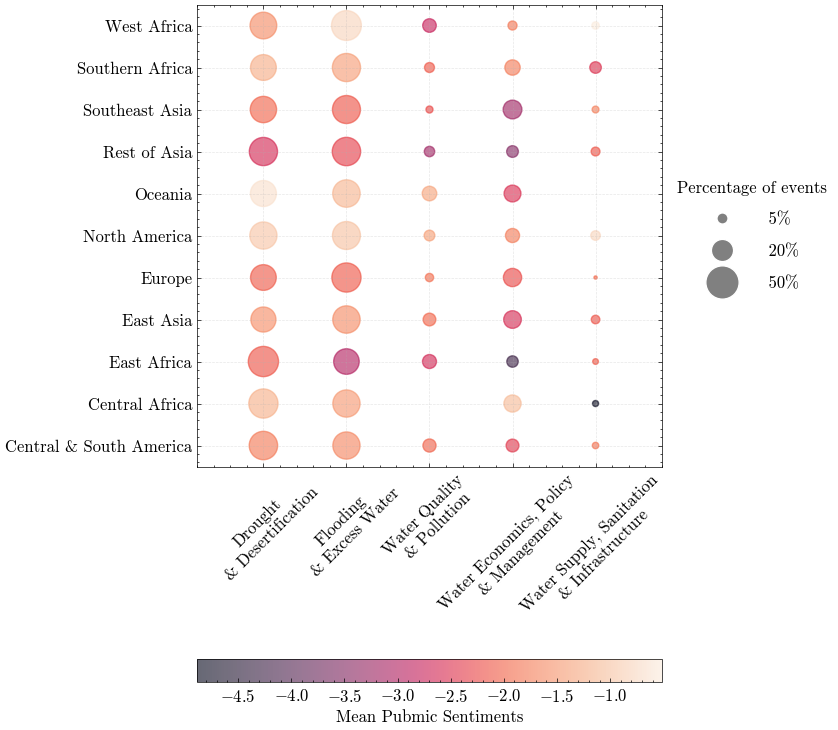

In [38]:
fig, ax = plt.subplots(figsize=(6, 10))
norm = plt.Normalize(stat['AvgTone'].min(), stat['AvgTone'].max())

# Scatter plot with color and size encoding
scatter = ax.scatter(
    data=stat,
    x='category',
    y='region',
    c='AvgTone',
    s=(stat['proportion']*1000),  # Adjust size for visual clarity
    cmap='rocket',
    norm=norm,
#     sizes=(50, 500),
    alpha=0.6
)

# Add a color bar outside the plot
cbar = fig.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.25, location='bottom')
cbar.set_label('Mean Pubmic Sentiments', fontsize=12)
cbar.ax.tick_params(labelsize=12) 

legend_handles = []
legend_labels = []
risk_levels = [1, 2, 3]  # Example risk levels
labels = ['   5%', '   20%', '   50%']
for idx, risk in enumerate(risk_levels):
    handle = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='grey', markersize=risk*8, label=labels[idx])
    legend_handles.append(handle)
    legend_labels.append(f'Risk level {risk}')

ax.legend(handles=legend_handles, title='Percentage of events', loc='center left', bbox_to_anchor=(1, 0.5),
          fontsize=12, labelspacing=1, title_fontsize=12)

# Adjust plot aesthetics
plt.margins(x=0.2)  # Adds 5% padding to the x-axis
plt.xticks([i for i in range(5)], [
  'Drought\n & Desertification',
  'Flooding\n & Excess Water',
  'Water Quality\n & Pollution',
  'Water Economics, Policy\n & Management',
  'Water Supply, Sanitation\n & Infrastructure']
           , rotation=45)
ax.tick_params(axis='both', labelsize=12)
plt.grid(True, linestyle='--', alpha=0.3)

# Show the plot
plt.show()

# public sentiment

## temporal

In [49]:
stat = df[(df['year']<=2023) & (df['year']>=2016)].drop_duplicates(subset=[
    'GLOBALEVENTID', 'region']).groupby(['year', 'region', 'is_ETM'])['AvgTone'].agg([
    np.mean, np.count_nonzero]).unstack().fillna(0)
stat['inc_ratio'] = (stat[('count_nonzero', 1)] / (stat[('count_nonzero', 1)] + stat[('count_nonzero', 0)]))
stat['count'] =  stat[('count_nonzero', 1)] + stat[('count_nonzero', 0)]
stat = stat[[('mean', 1), ('inc_ratio', ''), ('count', '')]].reset_index()
stat.columns = ['year', 'region', 'mean', 'inc_ratio', 'count']
stat['region']= pd.Categorical(stat['region'], ['Central Africa', 'East Africa', 'Southern Africa', 'West Africa', 'East Asia',  'Southeast Asia', 'Rest of Asia', 'Europe', 'North America', 'Central & South America', 'Oceania']) 
# stat.loc[(stat['inc_ratio']<0.02) & (stat['inc_ratio']!=0), 'inc_ratio'] = 0.02
stat = stat.sort_values(by='region', ascending=False)
stat.set_index(['region', 'year'])['mean'].unstack()


year,2016,2017,2018,2019,2020,2021,2022,2023
region,,,,,,,,
Central Africa,-3.576197,1.229726,-1.725755,-2.591137,-5.133929,-0.550908,0.000000,-2.066940
East Africa,-4.342236,-3.062927,-1.836315,-1.558822,0.969778,-6.686949,-0.995406,0.327534
Southern Africa,-2.114827,-0.772541,0.140090,-1.900846,-0.452606,-1.003849,-1.890940,1.656769
West Africa,-3.485605,-2.074256,-2.164176,0.000000,0.000000,1.176471,0.584864,-4.619030
East Asia,-1.223612,-0.667830,-2.374597,-0.650474,-0.502916,-1.351865,-0.906945,-1.397209
Southeast Asia,-2.411979,-5.681215,-4.804582,0.000000,-2.240364,-2.022255,0.547945,-1.361470
Rest of Asia,-2.430628,0.026348,-0.392260,-3.345270,0.000000,-1.894724,-1.831754,0.410092
Europe,-1.276561,-2.352472,-1.204178,-4.002953,-3.539581,-0.717526,0.625609,-0.019577
North America,-0.698160,-1.311997,-0.501750,-0.874319,-1.212454,-1.877413,-1.341178,-0.659909


In [50]:
temp = relative_change.stack().reset_index()
temp.columns = ['region', 'year', 'production_intensity']
stat = pd.merge(stat, temp, on=['year', 'region'])
stat.head()


,year,region,mean,inc_ratio,count,production_intensity
0,2017,Oceania,1.698993,0.000726,1378.0,1.627185
1,2022,Oceania,-0.178072,0.004405,454.0,2.129701
2,2016,Oceania,-7.969639,0.000792,1263.0,1.000000
3,2021,Oceania,-0.184162,0.001538,650.0,1.746151
4,2020,Oceania,-4.031150,0.003769,796.0,1.554767


In [55]:
stat.set_index(['region', 'year'])[['mean', 'production_intensity']].unstack()


mean                                                             production_intensity                                                            
year                         2016      2017      2018      2019      2020      2021      2022                 2016      2017      2018      2019      2020      2021      2022
region                                                                                                                                                                        
Central & South America -2.804733 -2.117665 -1.477568 -1.059666 -1.708807 -2.231737 -1.208867                  1.0  1.037356  1.070326  1.078483  1.133351  1.304718  1.442012
Central Africa          -3.576197  1.229726 -1.725755 -2.591137 -5.133929 -0.550908  0.000000                  1.0  1.168709  1.490671  1.124791  1.246593  1.323371  1.630749
East Africa             -4.342236 -3.062927 -1.836315 -1.558822  0.969778 -6.686949 -0.995406                  1.0  1.040051  1.787394  1.602613  1.193581  2.381878  3.100060
East Asia               -1.223612 -0.667830 -2.374597 -0.650474 -0.502916 -1.351865 -0.906945                  1.0  0.977783  0.906023  0.930927  1.032680  1.060596  1.119743
Europe                  -1.276561 -2.352472 -1.204178 -4.002953 -3.539581 -0.717526  0.625609                  1.0  1.048255  1.045830  1.049568  1.115673  1.092562  1.060713
North America           -0.698160 -1.311997 -0.501750 -0.874319 -1.212454 -1.877413 -1.341178                  1.0  1.032681  1.099227  0.958544  0.888877  0.864193  0.782480
Oceania                 -7.969639  1.698993 -0.429082 -1.559484 -4.031150 -0.184162 -0.178072                  1.0  1.627185  1.803602  1.631416  1.554767  1.746151  2.129701
Rest of Asia            -2.430628  0.026348 -0.392260 -3.345270  0.000000 -1.894724 -1.831754                  1.0  0.909698  0.896140  0.889830  0.816991  0.901487  0.936188
Southeast Asia          -2.411979 -5.681215 -4.804582  0.000000 -2.240364 -2.022255  0.547945                  1.0  1.272821  1.767438  2.028772  1.984300  2.451862  3.252894
Southern Africa         -2.114827 -0.772541  0.140090 -1.900846 -0.452606 -1.003849 -1.890940                  1.0  0.963915  1.100480  1.112813  0.931033  1.141358  1.127083
West Africa             -3.485605 -2.074256 -2.164176  0.000000  0.000000  1.176471  0.584864                  1.0  1.545437  1.962589  2.257606  2.372549  2.522565  2.825605

([<matplotlib.axis.XTick at 0x7fd71b852e80>,
 [Text(2016, 0, '$\\mathdefault{2016}$'),
  Text(2017, 0, '$\\mathdefault{2017}$'),
  Text(2018, 0, '$\\mathdefault{2018}$'),
  Text(2019, 0, '$\\mathdefault{2019}$'),
  Text(2020, 0, '$\\mathdefault{2020}$'),
  Text(2021, 0, '$\\mathdefault{2021}$'),
  Text(2022, 0, '$\\mathdefault{2022}$')])

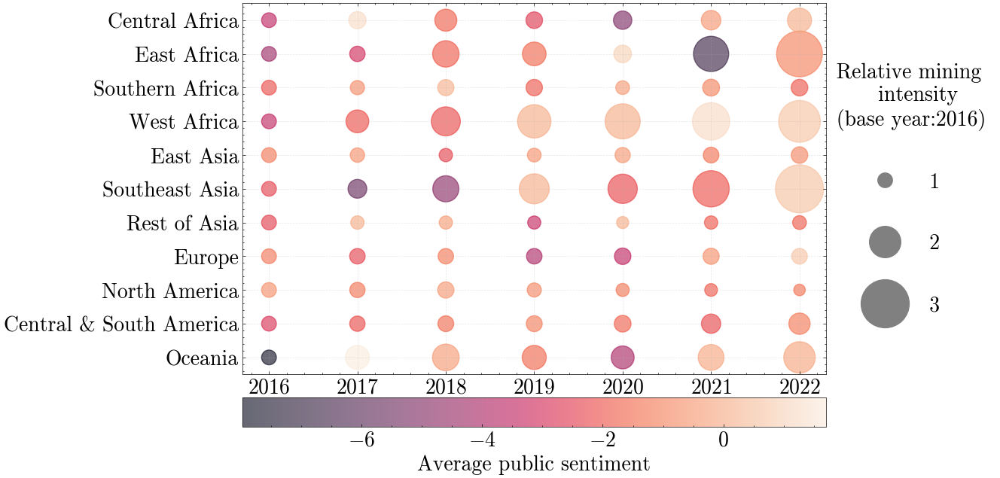

In [44]:
fig, ax = plt.subplots(figsize=(10, 8))
norm = plt.Normalize(stat['mean'].min(), stat['mean'].max())

# Scatter plot with color and size encoding
stat['size'] = np.square((stat['production_intensity']))*200
scatter = ax.scatter(
    data=stat,
    x='year',
    y='region',
    c='mean',
    s='size',  # Adjust size for visual clarity
    cmap='rocket',
    norm=norm,
#     sizes=(100, 800),
    alpha=0.6
)

# Add a color bar outside the plot
cbar = fig.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.05, location='bottom')
cbar.set_label('Average public sentiment', fontsize=20)
cbar.ax.tick_params(labelsize=20) 

legend_handles = []
legend_labels = []
risk_levels = [1, 2, 3]  # Example risk levels
labels = [' 1', ' 2', ' 3']
for idx, risk in enumerate(risk_levels):
    handle = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='grey', markersize=risk*16, label=labels[idx])
    legend_handles.append(handle)
    legend_labels.append(f'{risk}')

ax.legend(handles=legend_handles, title='   Relative mining \n         intensity\n   (base year:2016)', loc='center left', bbox_to_anchor=(0.95, 0.5),
         fontsize=20, labelspacing=2, title_fontsize=20)

# Adjust plot aesthetics
plt.xticks(range(2016, 2023))
ax.tick_params(axis='both', labelsize=20)
plt.grid(True, linestyle='--', alpha=0.3)

# Show the plot
plt.show()

In [ ]:
stat = df[(df['is_ETM']==1)].drop_duplicates(subset=[
    'GLOBALEVENTID', 'category']).groupby(['month', 'category'])['AvgTone'].mean().unstack()

f, axes = plt.subplots(1, 1, figsize=(5, 4), dpi=300)
stat
stat.plot(label='1', ax=axes)
plt.fill_betweenx(y=[-3, -0], x1=6, x2=10, color=(247/255,220/255,183/255), alpha=0.6, edgecolor=None)
plt.title('x', color='white')
plt.ylabel('Average of public sentiment', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.xticks([2, 4, 6, 8, 10, 12], fontsize=20)
plt.yticks([-3, -2, -1, 0], fontsize=20)
plt.tick_params(axis='both', which='both', top=False, right=False, labelsize=20)
plt.legend([])
plt.show()


<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Europe')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

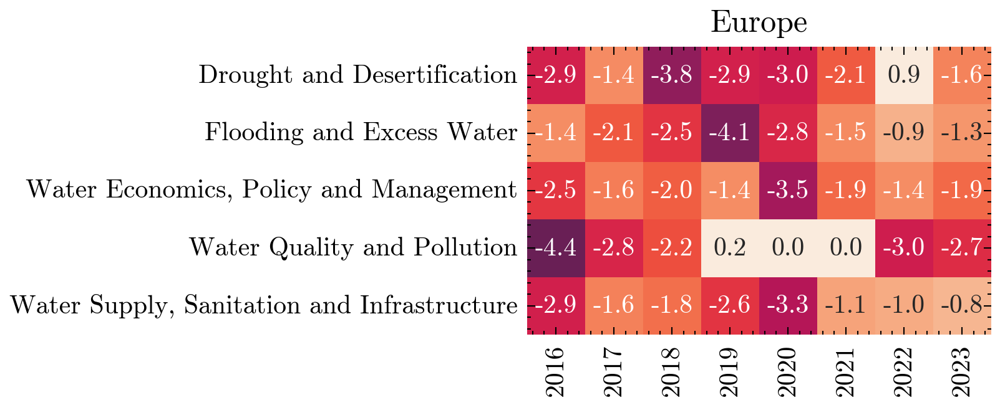

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'East Asia')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

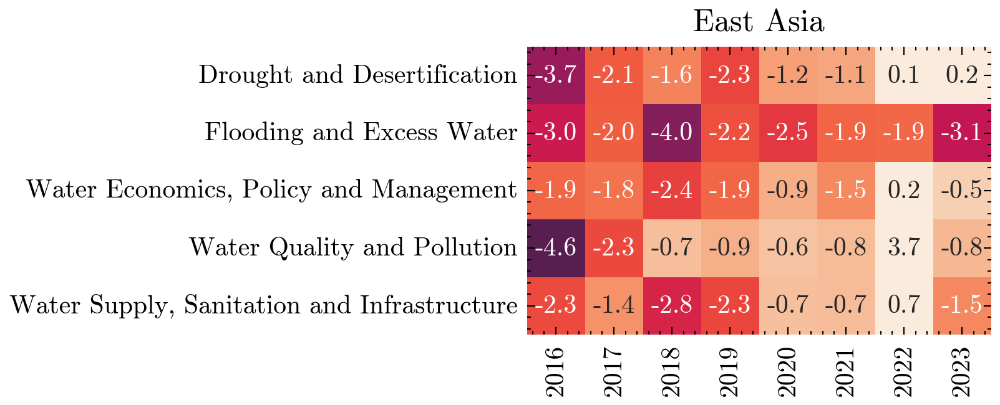

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Southern Africa')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

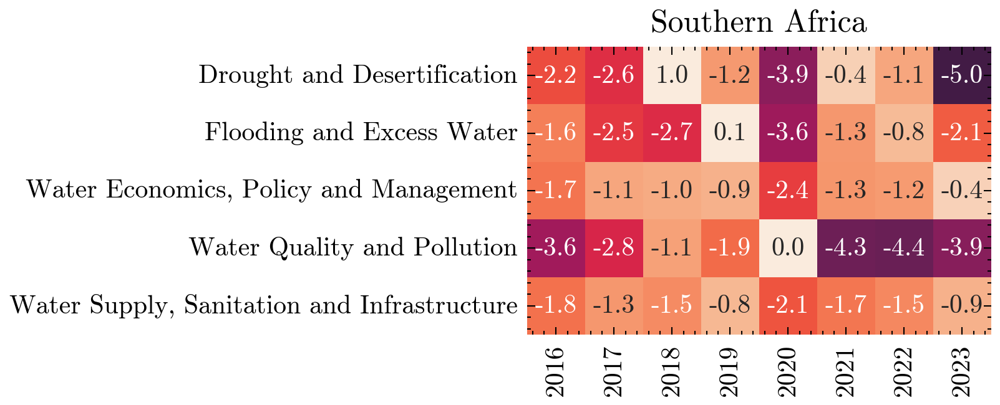

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'North America')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

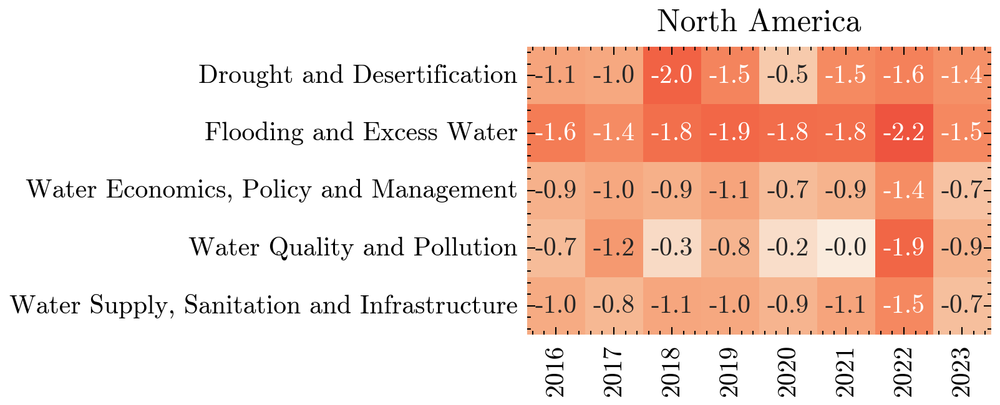

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Rest of Asia')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

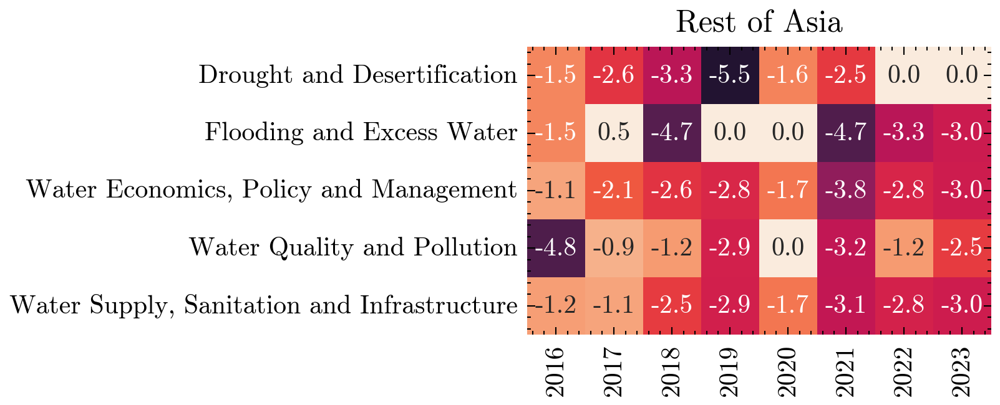

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Southeast Asia')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

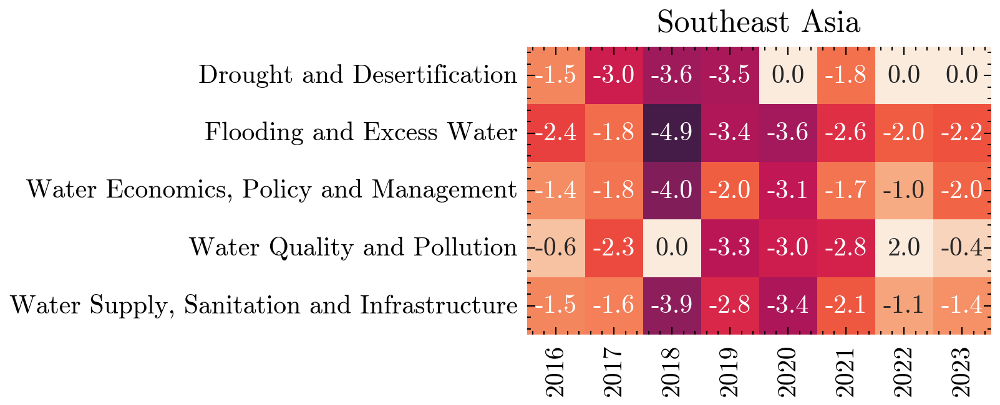

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Oceania')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

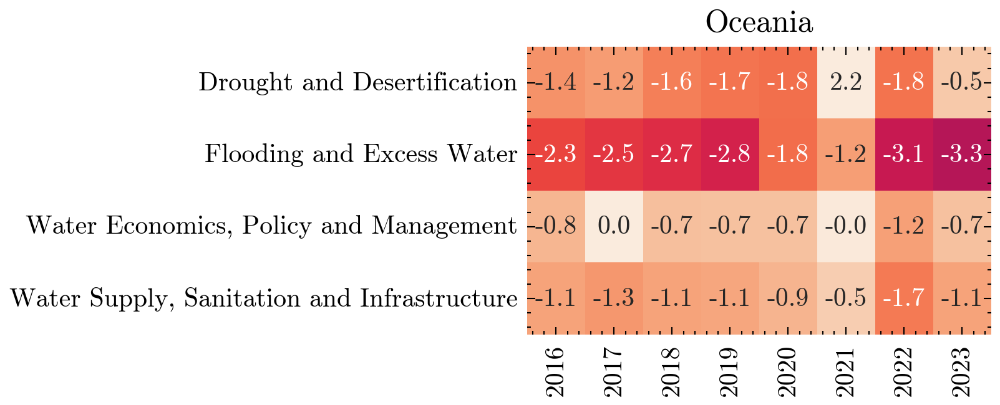

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Central & South America')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

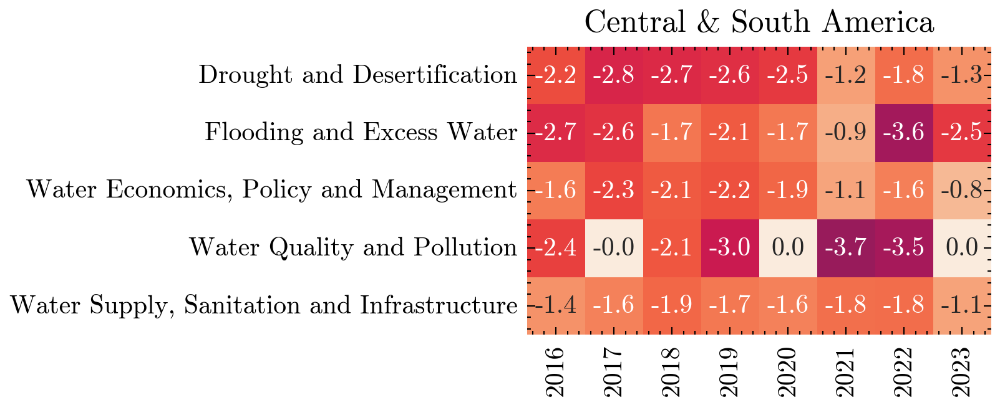

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'East Africa')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

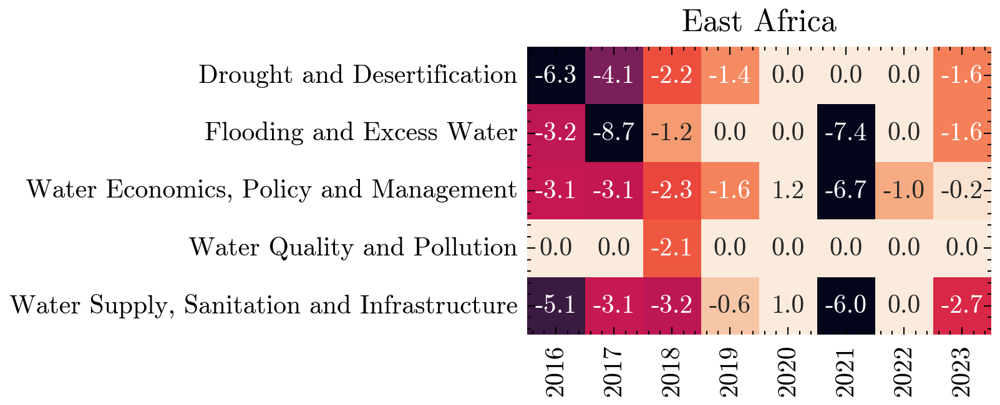

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'West Africa')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

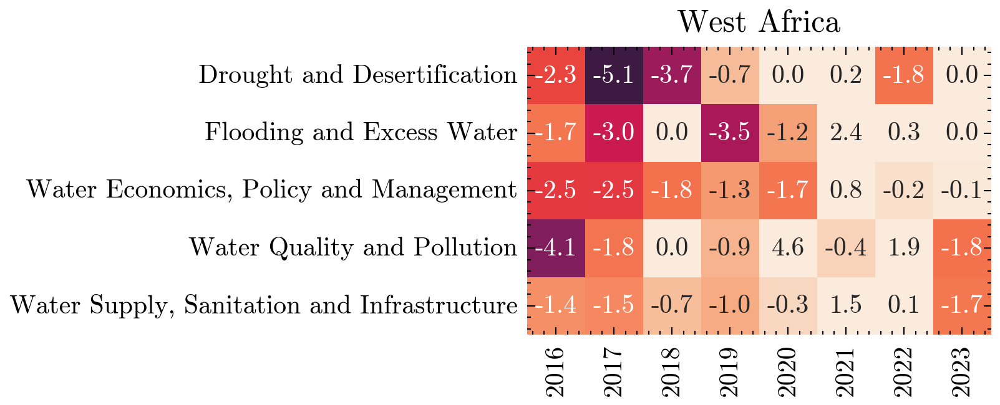

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0, 0.5, 'Drought and Desertification'),
  Text(0, 1.5, 'Flooding and Excess Water'),
  Text(0, 2.5, 'Water Economics, Policy and Management'),
  Text(0, 3.5, 'Water Quality and Pollution'),
  Text(0, 4.5, 'Water Supply, Sanitation and Infrastructure')])

Text(0.5, 1.0, 'Central Africa')

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

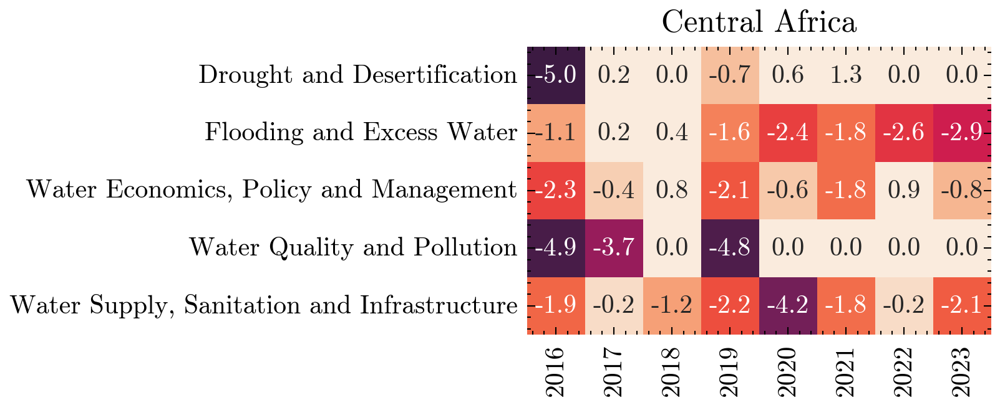

In [216]:
for i in df['region'].unique():
    stat = df[df['region'].isin([i]) & (df['is_ETM']==1) & (df['year']<=2023) & (df['year'] > 2015)
             ].drop_duplicates(subset=[
    'GLOBALEVENTID', 'category']).groupby(['category', 'year'])['AvgTone'].mean()
    stat = stat.unstack().fillna(0)

    f, axes = plt.subplots(1, 1, figsize=(3.2, 2), dpi=300)
    sns.heatmap(stat, ax=axes, cmap='rocket', cbar=False, vmin=-6, vmax=0, annot=True,
                fmt='.1f', annot_kws={'fontsize':10})        
    plt.xticks(fontsize=10, rotation=90)    
    plt.yticks(fontsize=10)    
    plt.title(i, fontsize=12)
    plt.xlabel('')
    plt.ylabel('')
    plt.legend()
    plt.show()


<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

([<matplotlib.axis.YTick at 0x7fc220de52e0>,
 [Text(0, 0.5, 'Drought'),
  Text(0, 1.5, 'Flooding'),
  Text(0, 2.5, 'Water economics'),
  Text(0, 3.5, 'Water quality'),
  Text(0, 4.5, 'Water supply')])

Text(0.5, 8.406249999999982, '')

Text(92.24999999999996, 0.5, '')

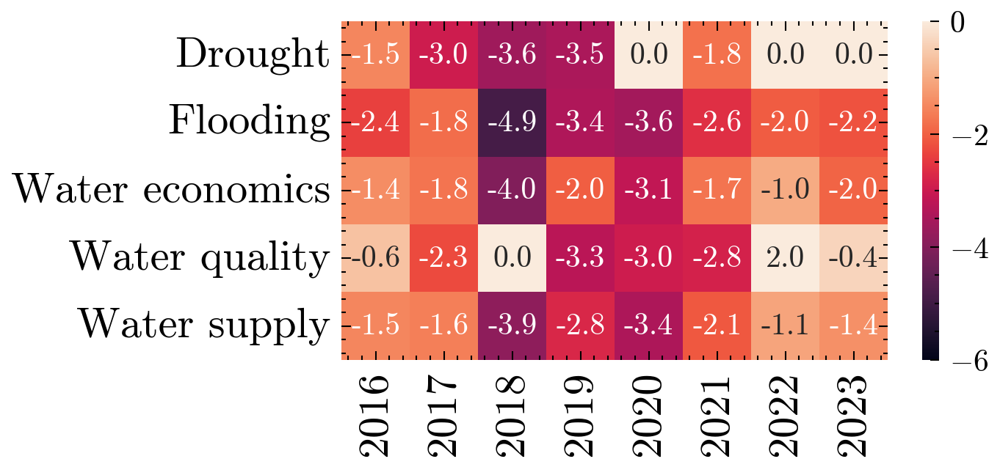

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

([<matplotlib.axis.YTick at 0x7fc2839eacd0>,
 [Text(0, 0.5, 'Drought'),
  Text(0, 1.5, 'Flooding'),
  Text(0, 2.5, 'Water economics'),
  Text(0, 3.5, 'Water quality'),
  Text(0, 4.5, 'Water supply')])

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

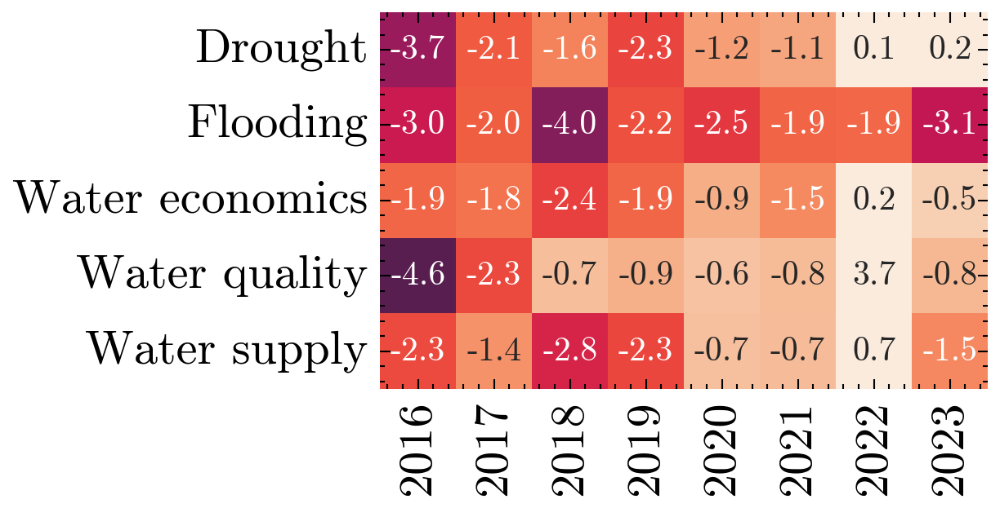

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

([<matplotlib.axis.YTick at 0x7fc27e3fad00>,
 [Text(0, 0.5, 'Drought'),
  Text(0, 1.5, 'Flooding'),
  Text(0, 2.5, 'Water economics'),
  Text(0, 3.5, 'Water quality'),
  Text(0, 4.5, 'Water supply')])

Text(0.5, 8.406249999999982, '')

Text(92.24999999999996, 0.5, '')

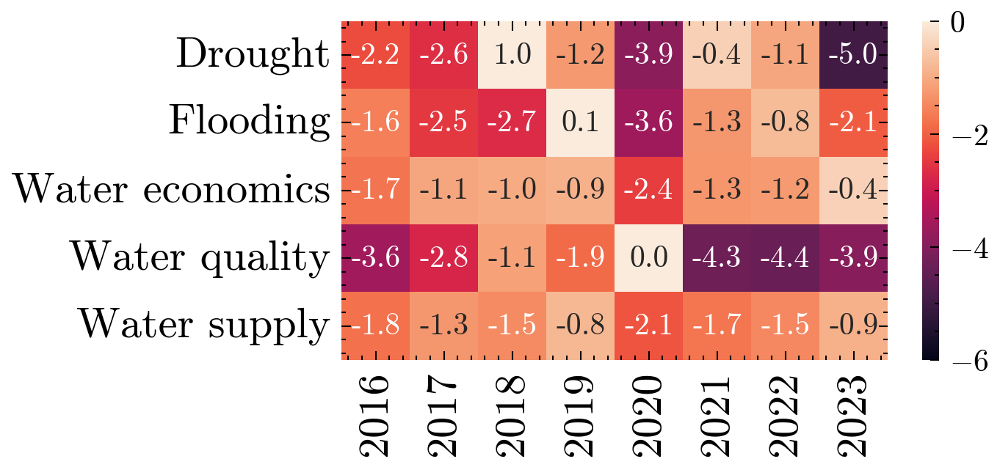

<Axes: xlabel='year', ylabel='category'>

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 [Text(0.5, 0, '2016'),
  Text(1.5, 0, '2017'),
  Text(2.5, 0, '2018'),
  Text(3.5, 0, '2019'),
  Text(4.5, 0, '2020'),
  Text(5.5, 0, '2021'),
  Text(6.5, 0, '2022'),
  Text(7.5, 0, '2023')])

([<matplotlib.axis.YTick at 0x7fc297c22d60>,
 [Text(0, 0.5, 'Drought'),
  Text(0, 1.5, 'Flooding'),
  Text(0, 2.5, 'Water economics'),
  Text(0, 3.5, 'Water quality'),
  Text(0, 4.5, 'Water supply')])

Text(0.5, 8.406249999999982, '')

Text(62.24999999999996, 0.5, '')

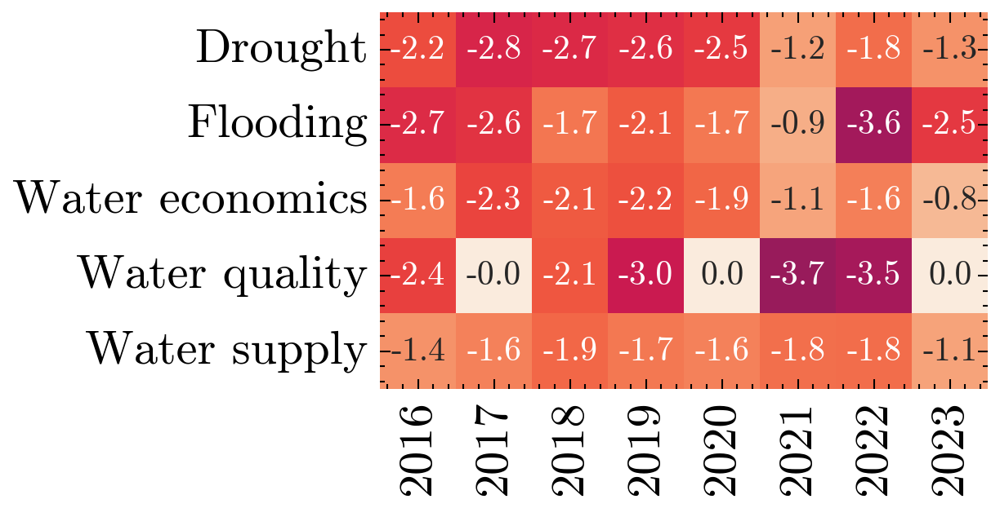

In [217]:
cnt = 0
for i in ['Southeast Asia', 'East Asia', 'Southern Africa', 'Central & South America']:
    cnt += 1
    stat = df[df['region'].isin([i]) & (df['is_ETM']==1) & (df['year']<=2023) & (df['year'] > 2015)
             ].drop_duplicates(subset=[
    'GLOBALEVENTID', 'category']).groupby(['category', 'year'])['AvgTone'].mean()
    stat = stat.unstack().fillna(0)

    if (cnt==1) | (cnt==3):
        f, axes = plt.subplots(1, 1, figsize=(4, 2), dpi=300)
        sns.heatmap(stat, ax=axes, cmap='rocket', cbar=True, vmin=-6, vmax=0, annot=True,
                    fmt='.1f', annot_kws={'fontsize':10})
        cbar = axes.collections[-1].colorbar
        cbar.ax.tick_params(labelsize=10)
    else:
        f, axes = plt.subplots(1, 1, figsize=(3.2, 2), dpi=300)
        sns.heatmap(stat, ax=axes, cmap='rocket', cbar=False, vmin=-6, vmax=0, annot=True,
                    fmt='.1f', annot_kws={'fontsize':10})
    plt.xticks(fontsize=14, rotation=90)    
    plt.yticks([0.5+i for i in range(5)], ['Drought', 'Flooding', 'Water economics', 'Water quality',
                          'Water supply'], fontsize=14)    
    plt.xlabel('')
    plt.ylabel('')
    plt.legend()
    plt.show()


<Figure size 1200x3600 with 0 Axes>

Text(0.5, 0, 'Tone of Events')

(-15.0, 15.0)

([<matplotlib.axis.YTick at 0x7fc239511f10>,
 [Text(0, 17167.0, '2017-01'),
  Text(0, 17348.0, '2017-07'),
  Text(0, 17532.0, '2018-01'),
  Text(0, 17713.0, '2018-07'),
  Text(0, 17897.0, '2019-01'),
  Text(0, 18078.0, '2019-07'),
  Text(0, 18262.0, '2020-01'),
  Text(0, 18444.0, '2020-07'),
  Text(0, 18628.0, '2021-01'),
  Text(0, 18809.0, '2021-07'),
  Text(0, 18993.0, '2022-01'),
  Text(0, 19174.0, '2022-07')])

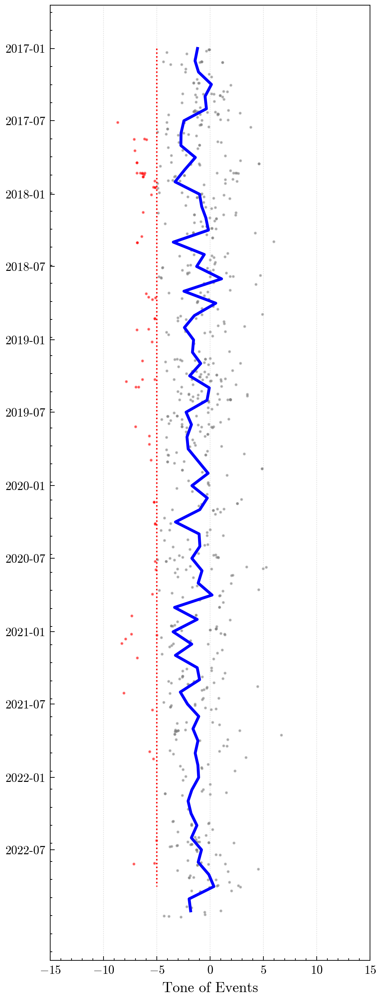

In [218]:
temp = df.drop_duplicates(subset=['GLOBALEVENTID']).sort_values(by='DATEADDED')
temp = temp[(temp['is_ETM']==1) & (temp['DATEADDED']<'2023-01-01') & (temp['DATEADDED']>='2017-01-01')]
temp['year-month'] = temp['DATEADDED'].map(lambda x: str(x)[:7])
stat = temp.groupby('year-month')['AvgTone'].agg([np.mean, np.min]).reset_index()
stat['year-month'] = pd.to_datetime(stat['year-month'], format='%Y-%m')

plt.figure(figsize=(4, 12), dpi=300)
plt.plot(stat['mean'], stat['year-month'], linewidth=2, color='b')
plt.scatter(temp[temp['AvgTone']>-5]['AvgTone'], temp[temp['AvgTone']>-5]['DATEADDED'], color='grey', s=1, alpha=0.5)
plt.scatter(temp[temp['AvgTone']<=-5]['AvgTone'], temp[temp['AvgTone']<=-5]['DATEADDED'], color='red', s=1, alpha=0.5)

plt.xlabel('Tone of Events', fontsize=10)
plt.xlim(-15, 15)

ticks = stat['year-month'][::6].tolist()# + [pd.Timestamp('2022-10-01 00:00:00')]
plt.yticks(ticks=ticks, labels=[x.strftime('%Y-%m') for x in ticks])
plt.vlines(-5, pd.Timestamp('2017-01-01 00:00:00'), pd.Timestamp('2022-10-01 00:00:00'),
           color='r', linestyles='dotted')

plt.tick_params(axis='both', which='both', top=False, right=False, labelsize='large')

plt.grid(axis='x', linestyle='dotted', alpha=0.5)
plt.gca().invert_yaxis()
plt.show()


Water Quality and Pollution
Flooding and Excess Water
Drought and Desertification


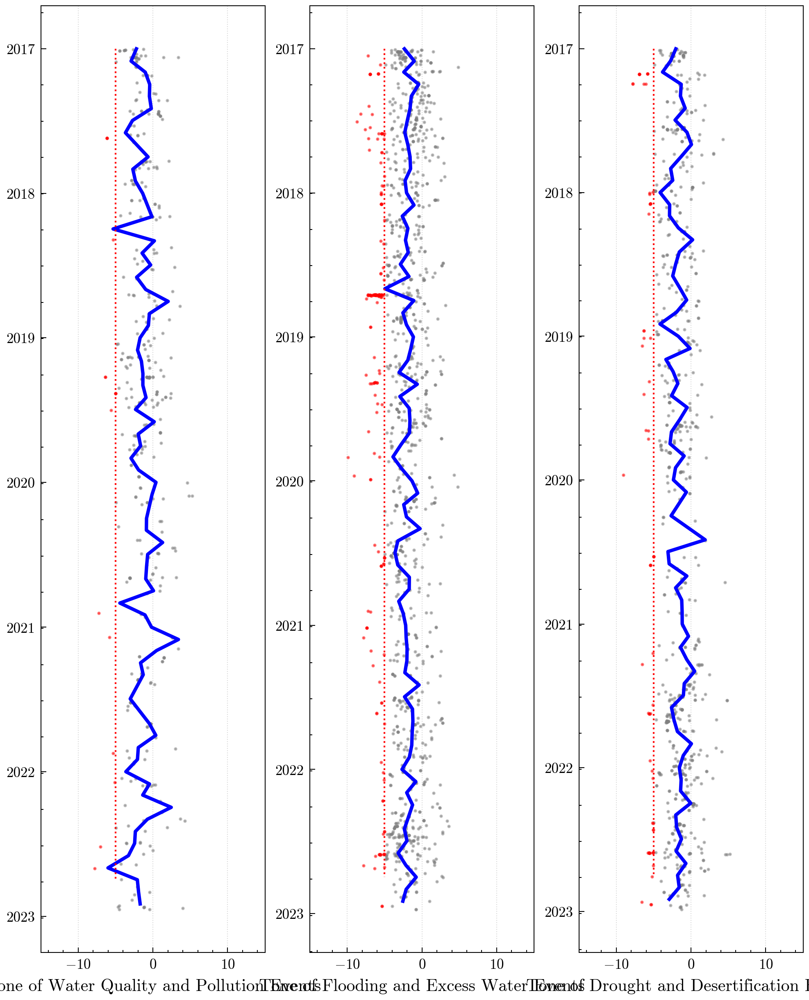

In [219]:
f, axes = plt.subplots(1, 3, figsize=(8, 10), dpi=300)
for k, i in enumerate(['Water Quality and Pollution',
                       'Flooding and Excess Water',
                       'Drought and Desertification',
                       ]):
    print(i)
    axs = axes[k]
    temp = df[(df['is_ETM']==1) & (df['DATEADDED']<'2023-01-01') & (df['DATEADDED']>='2017-01-01')]
    temp = temp[temp['category']==i].drop_duplicates(subset=['GLOBALEVENTID']).sort_values(by='DATEADDED')
    stat = temp.groupby('year-month')['AvgTone'].agg([np.mean, np.min]).reset_index()
    stat['year-month'] = pd.to_datetime(stat['year-month'], format='%Y-%m')

    t = axs.plot(stat['mean'], stat['year-month'], linewidth=2, color='b')
    t = axs.scatter(temp[temp['AvgTone']>-5]['AvgTone'], temp[temp['AvgTone']>-5]['DATEADDED'], color='grey', s=1, alpha=0.5)
    t = axs.scatter(temp[temp['AvgTone']<=-5]['AvgTone'], temp[temp['AvgTone']<=-5]['DATEADDED'], color='red', s=1, alpha=0.5)

    t = axs.set_xlabel('Tone of %s Events'%i, fontsize=10)
    t = axs.set_xlim(-15, 15)
    t = axs.vlines(-5, pd.Timestamp('2017-01-01 00:00:00'), pd.Timestamp('2022-10-01 00:00:00'),
               color='r', linestyles='dotted')

    t = axs.tick_params(axis='both', which='both', top=False, right=False, labelsize='large')

    t = axs.grid(axis='x', linestyle='dotted', alpha=0.5)
    axs.invert_yaxis()

plt.show()


## spatial

In [220]:
k = 2023
df['weight'] = 2.0 ** (df['year']-2023)
df['weighted_AvgTone'] = df['AvgTone'] * df['weight']

temp = df[df['is_ETM']==1].groupby([
    'latitude', 'longitude', 'prop_id', 'year'])[['weighted_AvgTone', 'weight']].mean().unstack().fillna(0)
temp['production'] = df[df['is_ETM']==1].groupby([
    'latitude', 'longitude', 'prop_id'])['production'].mean()

temp['score'] = temp['weighted_AvgTone'].sum(axis=1) / temp['weight'].sum(axis=1)
temp = temp.reset_index()
temp.head()


latitude  longitude prop_id weighted_AvgTone                                                                                    weight                                                             production     score
year                                          2015      2016      2017      2018      2019      2020      2021      2022      2023      2015      2016      2017     2018    2019   2020  2021 2022 2023                     
0    -41.77389  145.54194   27542         0.000357  0.011695  0.000000  0.000000 -0.073820  0.031780  0.000000 -0.937808 -2.138493  0.003906  0.007812  0.000000  0.00000  0.0625  0.125  0.00  0.5  1.0    13310.0 -1.828069
1    -41.57917  145.72556   36012         0.000000  0.011695  0.000000  0.000000 -0.073820  0.031780  0.000000 -0.937808 -2.138493  0.000000  0.007812  0.000000  0.00000  0.0625  0.125  0.00  0.5  1.0    17601.0 -1.832492
2    -41.56869  145.71074   25694         0.000000  0.011695  0.000000  0.000000 -0.073820  0.031780  0.000000 -0.937808 -2.138493  0.000000  0.007812  0.000000  0.00000  0.0625  0.125  0.00  0.5  1.0    17483.0 -1.832492
3    -35.06389  149.57194   27104         0.000000 -0.003268  0.017356 -0.013228 -0.206678 -0.182073 -0.254179 -1.451078  2.507375  0.000000  0.007812  0.015625  0.03125  0.0625  0.125  0.25  0.5  1.0        NaN  0.207926
4    -34.24583  -70.67500   32770         0.000000 -0.025395 -0.016416  0.000000 -0.093227 -0.265976  0.000000 -0.683068 -0.832329  0.000000  0.007812  0.015625  0.00000  0.0625  0.125  0.00  0.5  1.0    14671.5 -1.120094

In [225]:
stat = df[(df['is_ETM']==1) & (df['year']<=2023) & (df['year']>=2015)].groupby(['country_name', 'year'])['AvgTone'].mean().unstack()
stat.fillna(0).style.background_gradient()


year,2015,2016,2017,2018,2019,2020,2021,2022,2023
country_name,,,,,,,,,
Argentina,0.000000,-0.853040,0.000000,0.000000,-0.968486,0.000000,0.000000,0.000000,-0.083419
Armenia,-4.821466,-1.494634,-2.972770,-3.460675,-2.042561,-0.286182,-3.629832,-3.266832,-2.733555
Australia,-2.091751,-1.253531,-0.780849,-1.047931,-1.460948,-0.610584,-0.546974,-1.754962,-1.668212
Azerbaijan,0.000000,0.000000,-4.077253,-4.903706,0.000000,0.000000,-5.475763,0.000000,-5.115090
Bolivia,1.587302,1.859649,-0.195897,0.000000,0.000000,-1.556420,0.000000,-0.017289,0.021650
Botswana,0.000000,2.181549,-0.206689,0.197249,0.000000,0.000000,0.000000,0.530628,0.000000
Brazil,-1.052490,-6.695861,-2.206793,-2.790015,-9.929078,-5.167491,0.963035,-4.270639,0.000000
Canada,-0.566398,-1.024277,1.137052,-0.389234,-0.935471,0.369361,1.223090,-0.391101,-0.140762
Chile,-2.011360,-1.922220,-2.330201,-1.800294,-2.161185,-1.900386,-1.669469,-1.774320,-1.007232


# by metal

## mineral type

In [226]:
stat = df[(df['is_ETM']==1) & (df['year']>2021) & (df['Dist']<=100) & df['category'].isin([
    'Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification'
])].drop_duplicates(subset=[
    'GLOBALEVENTID', 'commodity', 'category']).groupby(['commodity'])['category'].apply(
    lambda x: x.value_counts(normalize=True)).unstack().fillna(0)
stat = stat[['Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification']]

stat_ = df[(df['is_ETM']==1) & (df['year']>2021) & (df['Dist']<=50) & df['category'].isin([
    'Water Economics, Policy and Management', 'Water Supply, Sanitation and Infrastructure'
])].drop_duplicates(subset=[
    'GLOBALEVENTID', 'commodity', 'category']).groupby(['commodity'])['category'].apply(
    lambda x: x.value_counts(normalize=True)).unstack().fillna(0)
stat_ = stat_[['Water Economics, Policy and Management', 'Water Supply, Sanitation and Infrastructure']]
stat = pd.concat([stat, stat_], axis=1)

stat.style.background_gradient(axis=None)


,Water Quality and Pollution,Flooding and Excess Water,Drought and Desertification,"Water Economics, Policy and Management","Water Supply, Sanitation and Infrastructure"
commodity,,,,,
Bauxite,0.000000,0.500000,0.500000,0.444444,0.555556
Cobalt,0.076923,0.769231,0.153846,0.476190,0.523810
Copper,0.103376,0.449367,0.447257,0.508582,0.491418
Lead,0.035714,0.642857,0.321429,0.502703,0.497297
Lithium,0.000000,0.363636,0.636364,0.375000,0.625000
Manganese,0.200000,0.600000,0.200000,0.431034,0.568966
Molybdenum,0.198895,0.464088,0.337017,0.477387,0.522613
Nickel,0.175676,0.554054,0.270270,0.454887,0.545113
PGM,0.069767,0.686047,0.244186,0.410000,0.590000


In [227]:
stat2 = df[(df['is_ETM']==1) & (df['year']>2021) & (df['Dist']<=100)].drop_duplicates(subset=[
    'GLOBALEVENTID', 'commodity', 'category']).groupby(['commodity', 'category'])['AvgTone'].mean().unstack()#.reset_index()
stat2 = stat2[['Water Quality and Pollution', 'Flooding and Excess Water', 'Drought and Desertification', 'Water Economics, Policy and Management',
             'Water Supply, Sanitation and Infrastructure']]
stat2.fillna(0).style.background_gradient(axis=None)


category,Water Quality and Pollution,Flooding and Excess Water,Drought and Desertification,"Water Economics, Policy and Management","Water Supply, Sanitation and Infrastructure"
commodity,,,,,
Bauxite,0.000000,-1.716350,2.507375,-0.465925,-0.778205
Cobalt,-2.873031,-1.859069,-1.686715,-0.578237,-0.865960
Copper,-1.322507,-1.912434,-1.288797,-1.109455,-1.207356
Lead,-0.931440,-2.184364,-1.649676,-1.170428,-1.201806
Lithium,0.000000,-2.195689,-0.271573,0.046685,-0.653088
Manganese,-2.735471,-1.261047,-3.543156,-0.025375,-0.708658
Molybdenum,-1.670704,-2.240664,-1.825757,-1.511913,-1.477619
Nickel,-2.530518,-2.046924,-2.147802,-1.013894,-1.054604
PGM,-3.822141,-1.871724,-2.072816,-1.358124,-1.489901


<Axes: xlabel='commodity'>

Text(0.5, 1.0, '')

Text(0.5, 0, '')

Text(0, 0.5, 'Proportion of media attention by category')

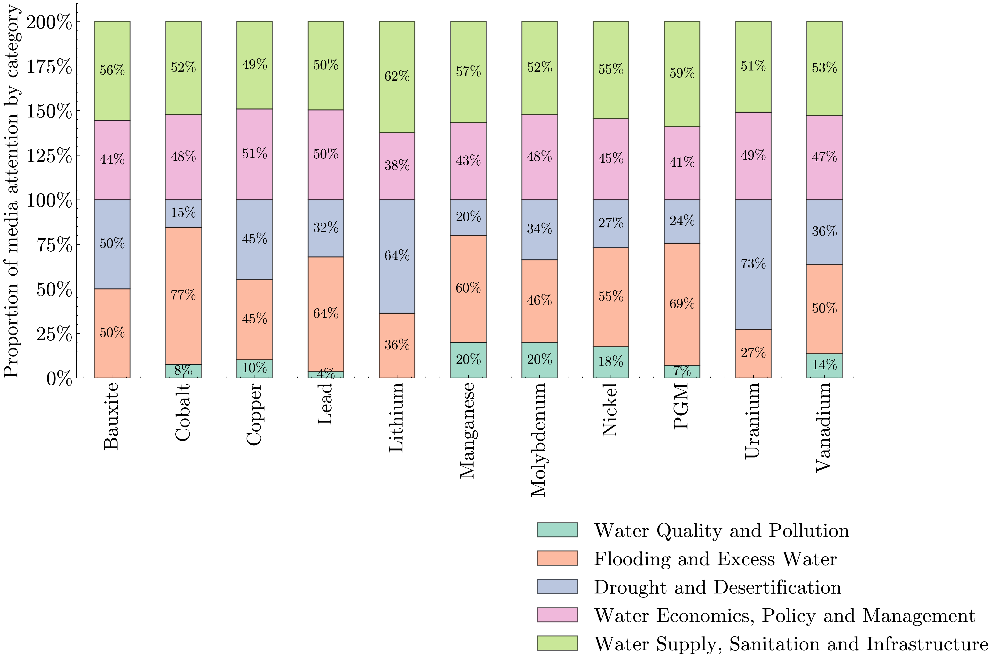

In [228]:
fig, ax1 = plt.subplots(figsize=(12, 7), dpi=300)
colors = mpl.colorbar.cm.Set2.colors[:5]

(stat * 100).plot(kind='bar', stacked=True, ax=ax1, color=colors, edgecolor='black', alpha=0.6, width=0.5)
ax1.set_title('', fontsize=20, weight='bold')
ax1.set_xlabel('', fontsize=15, weight='bold')
ax1.set_ylabel('Proportion of media attention by category', fontsize=20, weight='bold')
ax1.legend([])

ax1.tick_params(axis='x', labelsize=20, rotation=90)
ax1.tick_params(axis='y', labelsize=20)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')

import matplotlib.ticker as mtick
t = ax1.yaxis.set_major_formatter(mtick.PercentFormatter())

for i in range(stat.shape[0]):
    cumulative_sum = 0
    for j in range(stat.shape[1]):
        value = stat.iloc[i, j]
        if value > 0.02:
            t = ax1.text(i, (cumulative_sum + value / 2) * 100, f'{value:.0%}', ha='center', va='center', fontsize=14, color='black', weight='bold')
        cumulative_sum += value

fig.legend(loc='upper left', bbox_to_anchor=(0.6, 0), fontsize=20, ncol=1)
sns.despine(fig, ax1)
plt.tight_layout()
plt.show()


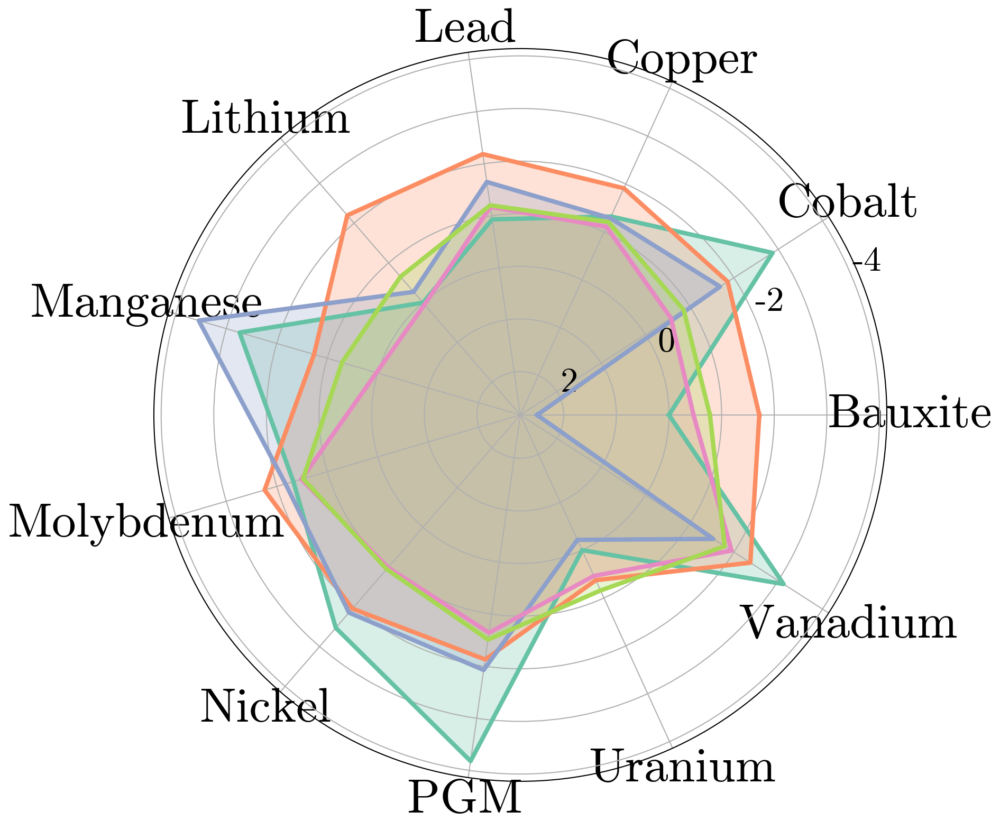

In [229]:
from math import pi

# Prepare data for radar chart
categories = list(stat2.index)
num_vars = len(categories)

# Function to plot radar chart
def plot_radar_chart(data, categories, title=''):
    # Create a radar chart
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True), dpi=300)

    # Compute angle for each axis
    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += angles[:1]  # Complete the loop

    # Plot each category
    for i, col in enumerate(data.columns):
        values = data.loc[:, col].tolist()
        values += values[:1]  # Complete the loop
        ax.plot(angles, values, label=col, linewidth=2, c=colors[i])
        ax.fill(angles, values, alpha=0.25, c=colors[i])

    # Customize the chart
    ax.set_yticklabels([2, '', 0, '', -2, '', -4, '', -6, '',], fontsize=16)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=22)

    # Add legend
#     plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1), fontsize=12)
    plt.title(title, size=15, color='black', y=1.1)

    plt.show()

# Plot radar chart for stat2 data
plot_radar_chart(-stat2.fillna(0), categories)


## commodity production

In [232]:
stat = df[(df['is_ETM']==1) & (df['production']>0) & (df['year'].isin([2021]))
         ].groupby(['prop_id', 'prop_name', 'commodity', 'production'])['AvgTone'].min().reset_index()
# bins = [-np.inf, -10, -7.5, -5, -2.5, 0, np.inf]
bins = [-np.inf, -5, -2, 0, np.inf]
stat['AvgTone_bin'] = pd.cut(stat['AvgTone'], bins = bins, labels=range(4, 0, -1))#.astype(float)
# stat['AvgTone_bin'] /= 6

stat = stat.groupby(['commodity', 'AvgTone_bin'])['production'].sum().unstack()
stat['total'] = stat.sum(axis=1)
metals_percentage_decimal = {
    "Bauxite": 0.75,
    "Cobalt": 0.62,
    "Copper": 0.66,
    "Graphite": 0.59,
    "Lead": 0.36,
    "Lithium": 0.81,
    "Manganese": 0.75,
    "Molybdenum": 0.20,
    "Nickel": 0.15,
    "Uranium": 0.28,
    "PGM": 0.26,
    "Vanadium": 1.00
}
stat = stat.reset_index()
stat['total2'] = stat['total'] / stat['commodity'].replace(metals_percentage_decimal)
stat['unknown'] = stat['total2'] - stat['total']
stat = stat.set_index('commodity')
for i in [1,2,3,4,'unknown']:
    stat[i] /= stat['total2']
del stat['total']
del stat['total2']
stat.style.background_gradient()


AvgTone_bin,4,3,2,1,unknown
commodity,,,,,
Bauxite,0.000000,0.557866,0.000000,0.192134,0.250000
Cobalt,0.015883,0.528509,0.069265,0.006343,0.380000
Copper,0.108686,0.357379,0.066053,0.127882,0.340000
Lead,0.006458,0.185629,0.107130,0.060782,0.640000
Lithium,0.000000,0.000000,0.256886,0.553114,0.190000
Manganese,0.163381,0.050576,0.536044,0.000000,0.250000
Molybdenum,0.062261,0.085028,0.045720,0.006991,0.800000
Nickel,0.023966,0.038722,0.079080,0.008231,0.850000
PGM,0.036748,0.123267,0.043126,0.056859,0.740000


<Axes: xlabel='commodity'>

Text(0.5, 1.0, '')

Text(0.5, 0, '')

Text(0, 0.5, 'Proportion of commodity production\n by level of public sentiment')

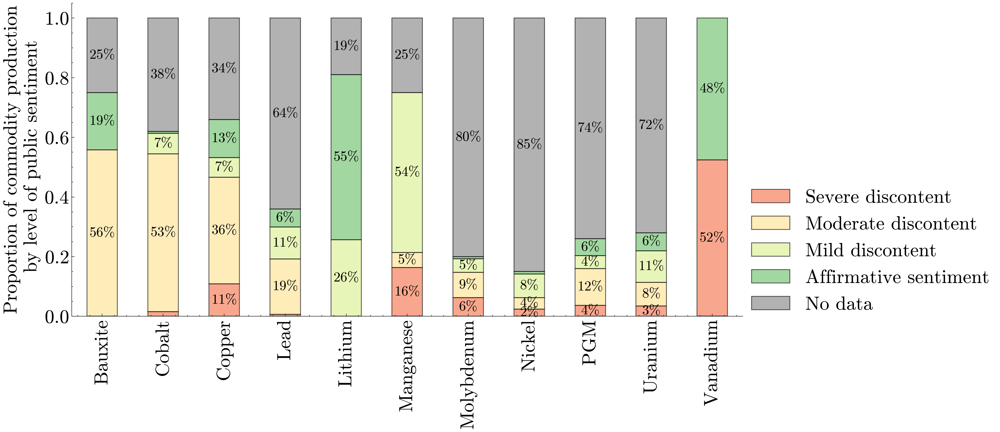

In [233]:
fig, ax1 = plt.subplots(figsize=(12, 7), dpi=300)
colors = sns.color_palette('RdYlGn', 4).as_hex() + ['#808080']

# 绘制柱状图
stat.plot(kind='bar', stacked=True, ax=ax1, color=colors, edgecolor='black', alpha=0.6, width=0.5)
ax1.set_title('', fontsize=22, weight='bold')
ax1.set_xlabel('', fontsize=22, weight='bold')
ax1.set_ylabel('Proportion of commodity production\n by level of public sentiment', fontsize=22, weight='bold')
ax1.legend([])

# 设置x轴和y轴标签
ax1.tick_params(axis='x', labelsize=22, rotation=90)
ax1.tick_params(axis='y', labelsize=22)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')

# 添加柱状图标签
for i in range(stat.shape[0]):
    cumulative_sum = 0
    for j in range(stat.shape[1]):
        value = stat.iloc[i, j]
        if value > 0.02:  # 只在比例大于1%的条形上添加标签
            t = ax1.text(i, cumulative_sum + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=16, color='black', weight='bold')
        cumulative_sum += value

# 设置图例
fig.legend(['Severe discontent', 'Moderate discontent', 'Mild discontent', 'Affirmative sentiment', 'No data'], loc='upper left',
           bbox_to_anchor=(0.98, 0.6), fontsize=22)
sns.despine(fig, ax1)
plt.tight_layout()
plt.show()


## development stage

<Axes: xlabel='commodity'>

current_stage,Exploration-stage,Feasibility-stage,Development-stage,Operating-stage
commodity,,,,
Bauxite,NaN,NaN,NaN,-1.354256
Cobalt,NaN,NaN,-2.425572,-0.213580
Copper,-0.688234,-1.391662,-1.324152,-1.522398
Graphite,NaN,NaN,NaN,-0.775758
Lead,NaN,-1.357043,-0.464163,-1.284836
Lithium,NaN,NaN,-1.062118,-0.195450
Manganese,NaN,NaN,-1.427137,-0.481907
Molybdenum,NaN,-3.711133,-1.507713,-1.463694
Nickel,-2.967459,NaN,-1.139113,-1.138338


Text(0.5, 0, '')

(-4.0, 2.0)

Text(0, 0.5, 'Mean public sentiment')

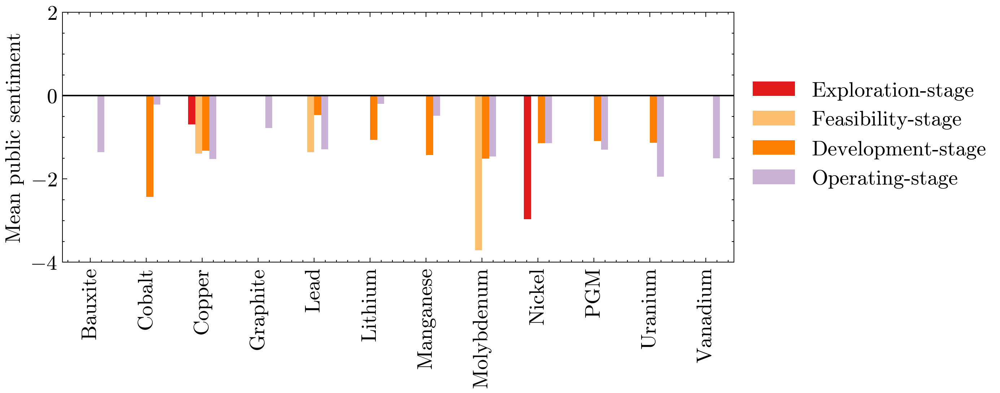

In [235]:
f, axes = plt.subplots(1, 1, figsize=(8, 3), dpi=300)
stat = df[df['is_ETM']==1].drop_duplicates(subset=['GLOBALEVENTID', 'current_stage', 'commodity']).groupby([
    'commodity', 'current_stage'])['AvgTone'].mean().unstack()[[
    'Exploration-stage', 'Feasibility-stage',
    'Development-stage', 'Operating-stage']]
stat.plot(kind='bar', ax=axes, color= mpl.colorbar.cm.Paired.colors[-7:-1])
stat
plt.hlines(0, -1, 12, color='black')
axes.tick_params(axis='both', labelsize=14)
plt.legend(fontsize=14, bbox_to_anchor=(1, 0.8))
plt.xlabel('')
plt.ylim(-4, 2)
plt.ylabel('Mean public sentiment', fontsize=14)


# data prep

In [236]:
stat = df[df['is_ETM']==1].drop_duplicates(subset=['prop_id', 'prop_name', 'country_name', 'region', 'latitude', 'longitude', 'month'])
stat.shape


(2487, 34)

In [237]:
# runoff

import xarray as xr
ds = xr.open_dataset('data/GRUN_v1_GSWP3_WGS84_05_1902_2014.nc')
runoff = ds['Runoff'].values
latitude = ds['Y'].values
longitude = ds['X'].values

def find_runoff(lat, lon, month):
    lat_idx = np.abs(latitude - lat).argmin()
    lon_idx = np.abs(longitude - lon).argmin()
    runoff_at_point = runoff[-(12 - month), lat_idx, lon_idx]
    return runoff_at_point

stat['runoff'] = stat.apply(lambda x: find_runoff(x['latitude'], x['longitude'], x['month']), axis=1)


In [238]:
# plot runoff 

import xarray as xr
ds = xr.open_dataset('data/GRUN_v1_GSWP3_WGS84_05_1902_2014.nc')
runoff = ds['Runoff'].values
latitude = ds['Y'].values
longitude = ds['X'].values
# Example: Plot temperature for the first month
plt.figure(figsize=(10, 6), dpi=200)
plt.imshow(runoff[10, :, :], cmap='PuBu', extent=(longitude.min(), longitude.max(), latitude.min(), latitude.max()), origin='lower')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [239]:
# precipitation

import xarray as xr

fs = glob.glob('data/first_guess_monthly_2020_*.nc')
# for i in range(1, 13):

def find_precipitation(lat, lon, month):
    precipitation_at_point = []
#     for i in range(1, 13):
    dat = xr.open_dataset(fs[month-1], decode_times=False)
    precipitation = dat['p'].values
    latitude = dat['lat'].values
    longitude = dat['lon'].values

    lat_idx = np.abs(latitude - lat).argmin()
    lon_idx = np.abs(longitude - lon).argmin()

    precipitation_at_point += [precipitation[:, lat_idx, lon_idx]]

    return np.mean(precipitation_at_point)

stat['precipitation'] = stat.apply(lambda x: find_precipitation(x['latitude'], x['longitude'], x['month']), axis=1)


In [240]:
# plot precipitation

import xarray as xr
ds = xr.open_dataset('data/first_guess_monthly_2020_05.nc', decode_times=False)
precipitation = ds['p'].values
latitude = ds['lat'].values
longitude = ds['lon'].values
plt.figure(figsize=(10, 6), dpi=200)
plt.imshow(runoff[0, :, :][::-1], cmap='Reds', extent=(longitude.min(), longitude.max(), latitude.min(), latitude.max()), origin='lower')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [241]:
temp = stat[['latitude', 'longitude']].drop_duplicates()


In [242]:
# pop_density

import rasterio
dataset = rasterio.open('data/gpw_v4_population_density_adjusted_to_2015_unwpp_country_totals_rev11_2020_30_sec.tif')

def lonlat_to_xy(lon, lat, dataset):
    transform = dataset.transform
    col, row = ~transform * (lon, lat)
    return int(col), int(row)

def find_pop_density(lat, lon):
    print('x')
    col, row = lonlat_to_xy(lon, lat, dataset)
    population_density = dataset.read(1)
    density_value = population_density[row, col]
    return density_value

temp['pop_density'] = temp.apply(lambda x: find_pop_density(x['latitude'], x['longitude']), axis=1)


In [243]:
# IMR

import rasterioa
dataset = rasterio.open('data/povmap_global_subnational_infant_mortality_rates_v2_01.tif')

def find_IMR(lat, lon):
    print('x')
    def lonlat_to_xy(lon, lat, dataset):
        transform = dataset.transform
        col, row = ~transform * (lon, lat)
        return int(col), int(row)

    col, row = lonlat_to_xy(lon, lat, dataset)
    IMR = dataset.read(1)
    IMR_value = IMR[row, col]
    return IMR_value

temp['IMR'] = temp.apply(lambda x: find_IMR(x['latitude'], x['longitude']), axis=1)


In [247]:
GRI = pd.read_excel('data/GRI.xlsx')


In [248]:
stat = pd.merge(stat, temp, on=['longitude', 'latitude', 'month'])
stat = pd.merge(stat, GRI, on=['country_name'], how='left')


In [244]:
stat[['longitude', 'latitude', 'month', 'pop_density', 'IMR', 'precipitation', 'runoff', 'GRI']].drop_duplicates().to_csv(
    'data/location_month_attributes.csv', index=None)


In [249]:
dic = pd.read_csv('../../4_Trade/data/BACI/country_codes_V202201.csv', encoding='gbk')
dic = dic.set_index('country2')['iso_3digit_alpha'].to_dict()
dic.update({"Dem. Rep. Congo":'COG', 'Dominican Republic':'DOM',
            'North Macedonia': 'MKD', 'Bolivia':'BOL', 'Lao':'LAO'})


In [250]:
stat['country_name_abbr'] = stat['country_name'].replace(dic)
stat['country_name_abbr'].unique()


array(['USA', 'BRA', 'AUS', 'DOM', 'CAN', 'MEX', 'PER', 'PAK', 'HND',
       'IDN', 'ZMB', 'CHL', 'PHL', 'NAM', 'SWE', 'IRL', 'RUS', 'PNG',
       'ZAF', 'BOL', 'MMR', 'MNG', 'SRB', 'COG', 'COL', 'NCL', 'CHN',
       'ZWE', 'IRN', 'MRT', 'CYP', 'MAR', 'UZB', 'ERI', 'IND', 'ESP',
       'FIN', 'ARM', 'MKD', 'KAZ', 'MDG', 'GTM', 'ECU', 'Laos', 'PAN',
       'AZE', 'TJK', 'ARG', 'PRK', 'GIN', 'GHA', 'MOZ', 'JAM', 'UKR',
       'ROU'], dtype=object)

In [251]:
import wbgapi as wb
import pandas as pd

countries = stat['country_name_abbr'].unique()
indicators = {
    'NY.GDP.PCAP.CD': 'GDP per capita',
    'SP.URB.TOTL.IN.ZS': 'Urban Population (%)',
    'SL.UEM.TOTL.ZS': 'Unemployment Rate (%)',
    'SI.POV.NAHC': 'Poverty Rate (%)',
    'SE.XPD.TOTL.GD.ZS': 'Education Expenditure (% of GDP)',
    'SE.SCH.LIFE': 'Mean Years of Schooling',
    'SP.DYN.LE00.IN': 'Life Expectancy',
    'SE.ADT.LITR.ZS': 'Literacy Rate (%)',
    'NY.ADJ.NNTY.PC.KD': 'Adjusted Net National Income per capita',
    'EN.ATM.CO2E.PC': 'CO2 Emissions per capita',
    'GE.EST': 'Government Effectiveness',
    'RL.EST': 'Rule of Law',
    'BX.KLT.DINV.WD.GD.ZS':'FDI',
    'CC.EST': 'Control of Corruption',
    'NY.GDP.TOTL.RT.ZS': 'Natural Resources Rents (% of GDP)'
}

data = wb.data.DataFrame(indicators.keys(), countries, time=2021, mrv=10)
data.columns = [indicators[i] for i in data.columns]
data = data.reset_index()
data.head()


,economy,FDI,Control of Corruption,Government Effectiveness,Adjusted Net National Income per capita,GDP per capita,Natural Resources Rents (% of GDP),Rule of Law,Literacy Rate (%),Education Expenditure (% of GDP),Poverty Rate (%),Unemployment Rate (%),Life Expectancy,Urban Population (%)
0,ARG,3.694019,-0.360884,-0.377517,10783.624763,14187.482725,2.653089,-0.410827,NaN,4.805210,39.2,6.178,76.064,92.463
1,ARM,2.409579,0.058400,-0.184130,3561.774944,8053.010663,7.054300,-0.122018,100.0,0.242600,24.8,8.586,73.372,63.739
2,AUS,1.880806,1.781205,1.589880,44512.596029,64820.911789,13.357875,1.523184,NaN,5.206777,NaN,3.667,83.200,86.617
3,AZE,0.349433,-1.195471,-0.032642,4460.301610,7125.908584,29.938395,-0.566586,100.0,3.582900,NaN,5.636,73.488,57.577
4,BOL,0.650691,-0.838301,-0.639481,2512.776921,3686.279965,9.467694,-1.219338,94.0,7.575500,36.4,3.081,64.928,71.186


# ols (category as feats)

## data

In [504]:
train = df[
           (df['year'].isin([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023])) &\
           (df['is_ETM']==1) &
           ((df['primary_commodity']==df['commodity']))
          ].groupby(['prop_id', 'prop_name', 'GLOBALEVENTID', 'country_name', 'current_stage', 'region',
                     'primary_commodity', 'longitude', 'latitude', 'Dist', 'production_r',
                     'category', 'is_ETM',
                     'year', 'month'])['AvgTone'].mean().reset_index()
train.shape


(11743, 16)

In [506]:
train = train.set_index(['prop_id', 'prop_name', 'GLOBALEVENTID', 'country_name', 'current_stage', 'region',
                        'primary_commodity', 'Dist', 'production_r', 'AvgTone', 'longitude', 'latitude', 
                        'year', 'month', 'is_ETM', 'category'])
train['temp'] = 1
train = train['temp'].unstack().fillna(0).reset_index()
train.shape
train.head()


(5734, 20)

category,prop_id,prop_name,GLOBALEVENTID,country_name,current_stage,region,primary_commodity,Dist,production_r,AvgTone,longitude,latitude,year,month,is_ETM,Drought and Desertification,Flooding and Excess Water,"Water Economics, Policy and Management",Water Quality and Pollution,"Water Supply, Sanitation and Infrastructure"
0,24469,Miami,482240531,USA,Operating-stage,North America,Copper,46.627123,0.000281,-0.281294,-110.897,33.393,2015,11,1,0.0,0.0,1.0,0.0,0.0
1,24469,Miami,516529495,USA,Operating-stage,North America,Copper,20.614678,0.000281,-4.720497,-110.897,33.393,2016,2,1,0.0,0.0,1.0,0.0,1.0
2,24469,Miami,546289664,USA,Operating-stage,North America,Copper,46.627123,0.000281,2.012384,-110.897,33.393,2016,6,1,1.0,0.0,1.0,0.0,0.0
3,24469,Miami,551661229,USA,Operating-stage,North America,Copper,29.097025,0.000281,-5.128205,-110.897,33.393,2016,6,1,1.0,0.0,1.0,0.0,0.0
4,24469,Miami,632267675,USA,Operating-stage,North America,Copper,46.627123,0.000281,1.657001,-110.897,33.393,2017,3,1,0.0,0.0,1.0,0.0,1.0


In [508]:
temp = pd.read_csv('data/location_month_attributes.csv')
train = pd.merge(train, temp, on=['longitude', 'latitude', 'month'])

dic = pd.read_csv('../../4_Trade/data/BACI/country_codes_V202201.csv', encoding='gbk')
dic = dic.set_index('country2')['iso_3digit_alpha'].to_dict()
dic.update({"Dem. Rep. Congo":'COG', 'Dominican Republic':'DOM',
            'North Macedonia': 'MKD', 'Bolivia':'BOL', 'Lao':'LAO'})
train['country_name_abbr'] = train['country_name'].replace(dic)
train = pd.merge(train, data, right_on='economy', left_on='country_name_abbr', how='left')
train.head()


,prop_id,prop_name,GLOBALEVENTID,country_name,current_stage,region,primary_commodity,Dist,production_r,AvgTone,longitude,latitude,year,month,is_ETM,Drought and Desertification,Flooding and Excess Water,"Water Economics, Policy and Management",Water Quality and Pollution,"Water Supply, Sanitation and Infrastructure",pop_density,IMR,precipitation,runoff,country_name_abbr,economy,FDI,Control of Corruption,Government Effectiveness,Adjusted Net National Income per capita,GDP per capita,Natural Resources Rents (% of GDP),Rule of Law,Literacy Rate (%),Education Expenditure (% of GDP),Poverty Rate (%),Unemployment Rate (%),Life Expectancy,Urban Population (%),CRI
0,24469,Miami,482240531,USA,Operating-stage,North America,Copper,46.627123,0.000281,-0.281294,-110.897,33.393,2015,11,1,0.0,0.0,1.0,0.0,0.0,0.0,6.023196,16.57,0.042401,USA,USA,1.258207,1.123433,1.217201,52320.656092,82769.412211,1.279944,1.327678,NaN,5.4283,NaN,3.625,77.434146,83.298,59.5
1,24469,Miami,516529495,USA,Operating-stage,North America,Copper,20.614678,0.000281,-4.720497,-110.897,33.393,2016,2,1,0.0,0.0,1.0,0.0,1.0,0.0,6.023196,37.38,0.014981,USA,USA,1.258207,1.123433,1.217201,52320.656092,82769.412211,1.279944,1.327678,NaN,5.4283,NaN,3.625,77.434146,83.298,59.5
2,24469,Miami,546289664,USA,Operating-stage,North America,Copper,46.627123,0.000281,2.012384,-110.897,33.393,2016,6,1,1.0,0.0,1.0,0.0,0.0,0.0,6.023196,39.65,0.009106,USA,USA,1.258207,1.123433,1.217201,52320.656092,82769.412211,1.279944,1.327678,NaN,5.4283,NaN,3.625,77.434146,83.298,59.5
3,24469,Miami,551661229,USA,Operating-stage,North America,Copper,29.097025,0.000281,-5.128205,-110.897,33.393,2016,6,1,1.0,0.0,1.0,0.0,0.0,0.0,6.023196,39.65,0.009106,USA,USA,1.258207,1.123433,1.217201,52320.656092,82769.412211,1.279944,1.327678,NaN,5.4283,NaN,3.625,77.434146,83.298,59.5
4,24469,Miami,632267675,USA,Operating-stage,North America,Copper,46.627123,0.000281,1.657001,-110.897,33.393,2017,3,1,0.0,0.0,1.0,0.0,1.0,0.0,6.023196,23.90,0.014919,USA,USA,1.258207,1.123433,1.217201,52320.656092,82769.412211,1.279944,1.327678,NaN,5.4283,NaN,3.625,77.434146,83.298,59.5


In [509]:
train.shape


(5734, 40)

## descrption

In [510]:
print(train.info())
print(train.describe().T)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5734 entries, 0 to 5733
Data columns (total 40 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   prop_id                                      5734 non-null   int64  
 1   prop_name                                    5734 non-null   object 
 2   GLOBALEVENTID                                5734 non-null   int64  
 3   country_name                                 5734 non-null   object 
 4   current_stage                                5734 non-null   object 
 5   region                                       5734 non-null   object 
 6   primary_commodity                            5734 non-null   object 
 7   Dist                                         5734 non-null   float64
 8   production_r                                 5734 non-null   float64
 9   AvgTone                                      5734 non-null   float64
 10  

## outlier

In [511]:
# f, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=600)
# train[['production_r', 'precipitation', 'runoff', 'month', 'year',
#        'pop_density', 'CRI',
#        'Government Effectiveness', 'Natural Resources Rents (% of GDP)',
#        'GDP per capita', 'Rule of Law', 'Control of Corruption',
#        'Education Expenditure (% of GDP)', 'Poverty Rate (%)',
#        'Unemployment Rate (%)', 'Urban Population (%)']].hist(ax=ax,
#                                                               bins=15, color='skyblue', edgecolor='black', alpha=0.7)
# plt.xlabel("Value")
# plt.ylabel("Frequency")


In [512]:
for i in ['production_r', 'precipitation', 'runoff', 'month', 'year',
       'pop_density', 'CRI',
       'Government Effectiveness', 'Natural Resources Rents (% of GDP)',
       'GDP per capita', 'Rule of Law', 'Control of Corruption',
       'Education Expenditure (% of GDP)', 'Poverty Rate (%)',
       'Unemployment Rate (%)', 'Urban Population (%)']:
    train.loc[train[i]<=0, i] = 1


array([<Axes: title={'center': 'AvgTone'}>], dtype=object)

Text(0.5, 1.0, '')

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

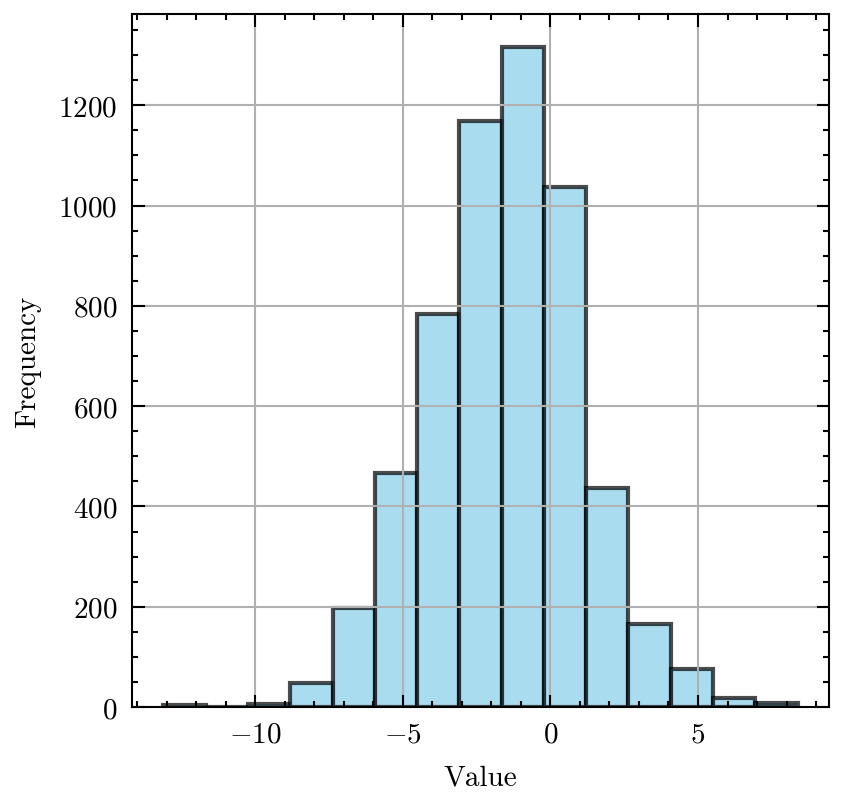

In [516]:
f, ax = plt.subplots(1, 1, figsize=(3, 3), dpi=300)
train[['AvgTone']].hist(ax=ax,
                        bins=15, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('')
plt.xlabel("Value")
plt.ylabel("Frequency")


array([[<Axes: title={'center': 'production_r'}>,
        <Axes: title={'center': 'precipitation'}>,
        <Axes: title={'center': 'runoff'}>,
        <Axes: title={'center': 'month'}>],
       [<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'pop_density'}>,
        <Axes: title={'center': 'CRI'}>,
        <Axes: title={'center': 'Government Effectiveness'}>],
       [<Axes: title={'center': 'Natural Resources Rents (% of GDP)'}>,
        <Axes: title={'center': 'GDP per capita'}>,
        <Axes: title={'center': 'Rule of Law'}>,
        <Axes: title={'center': 'Control of Corruption'}>],
       [<Axes: title={'center': 'Education Expenditure (% of GDP)'}>,
        <Axes: title={'center': 'Poverty Rate (%)'}>,
        <Axes: title={'center': 'Unemployment Rate (%)'}>,
        <Axes: title={'center': 'Urban Population (%)'}>]], dtype=object)

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

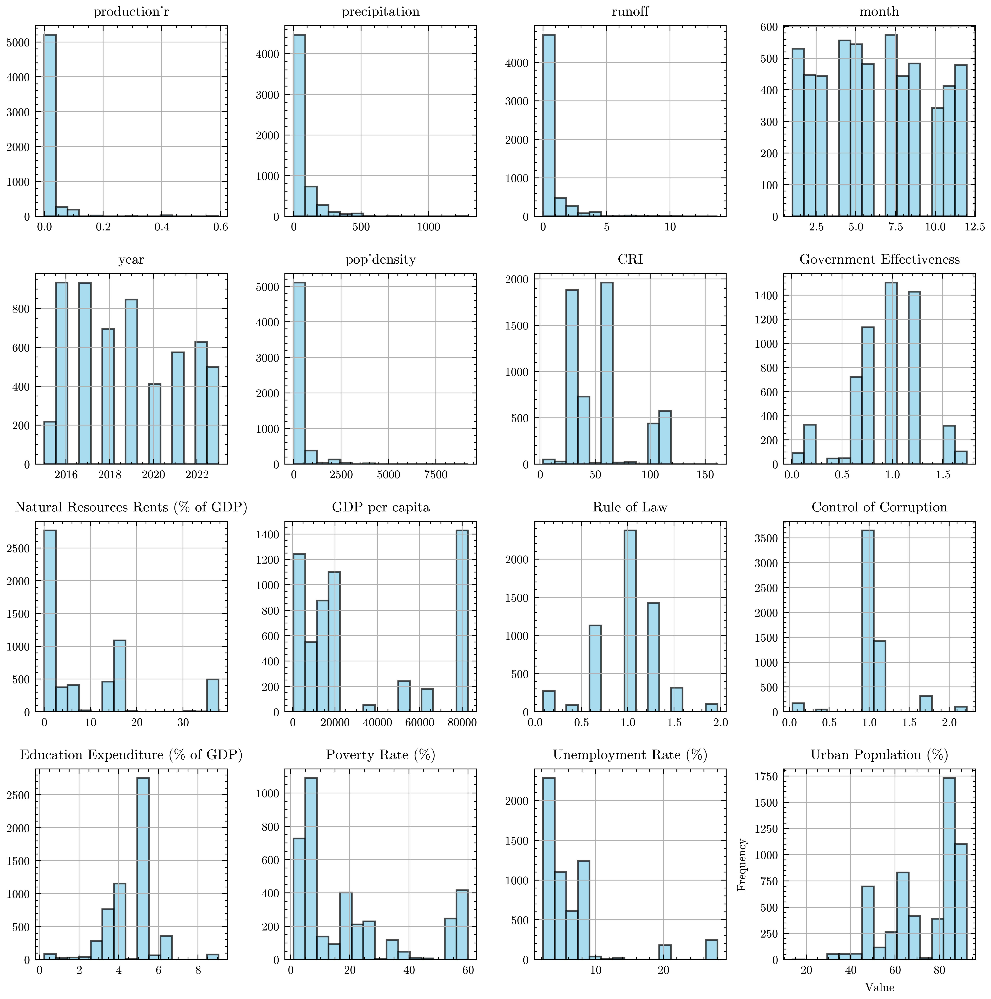

In [514]:
f, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=600)
train[['production_r', 'precipitation', 'runoff', 'month', 'year',
       'pop_density', 'CRI',
       'Government Effectiveness', 'Natural Resources Rents (% of GDP)',
       'GDP per capita', 'Rule of Law', 'Control of Corruption',
       'Education Expenditure (% of GDP)', 'Poverty Rate (%)',
       'Unemployment Rate (%)', 'Urban Population (%)']].hist(ax=ax,
                                                              bins=15, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel("Value")
plt.ylabel("Frequency")


<Axes: xlabel='primary_commodity'>

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='year'>

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

<Axes: xlabel='region'>

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

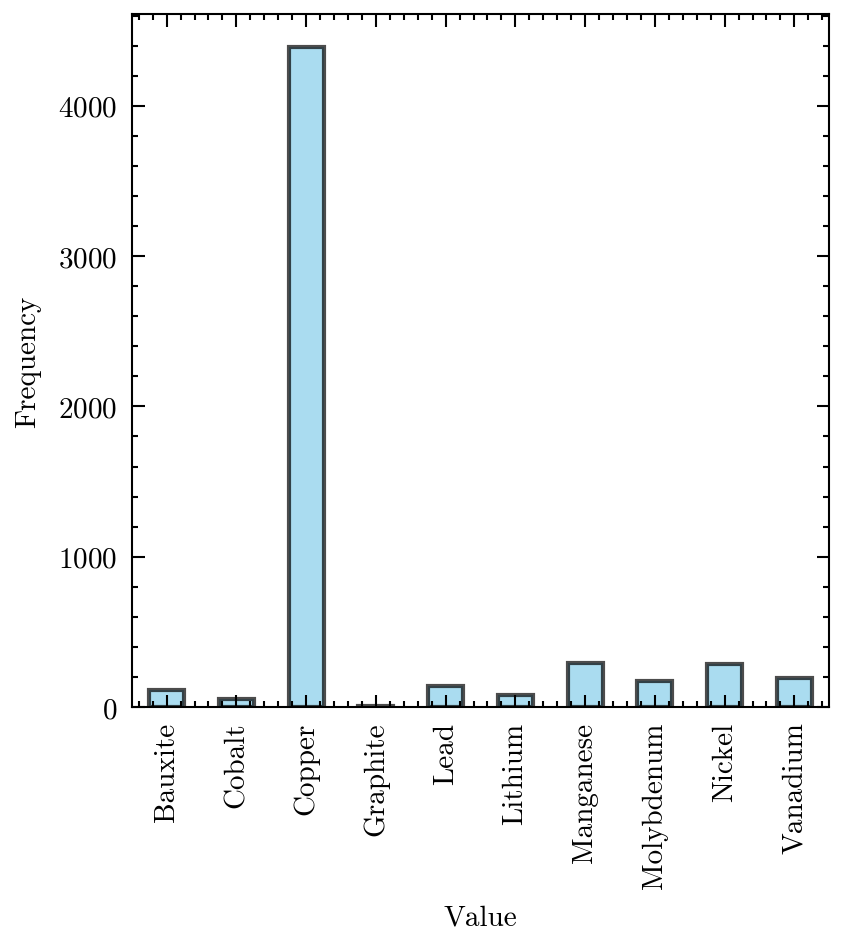

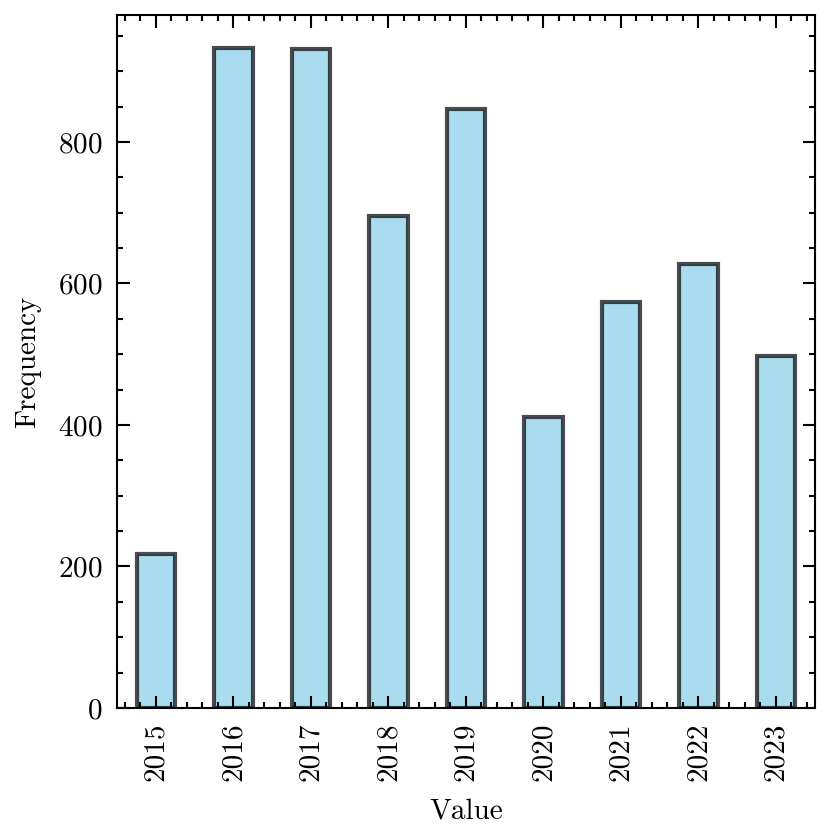

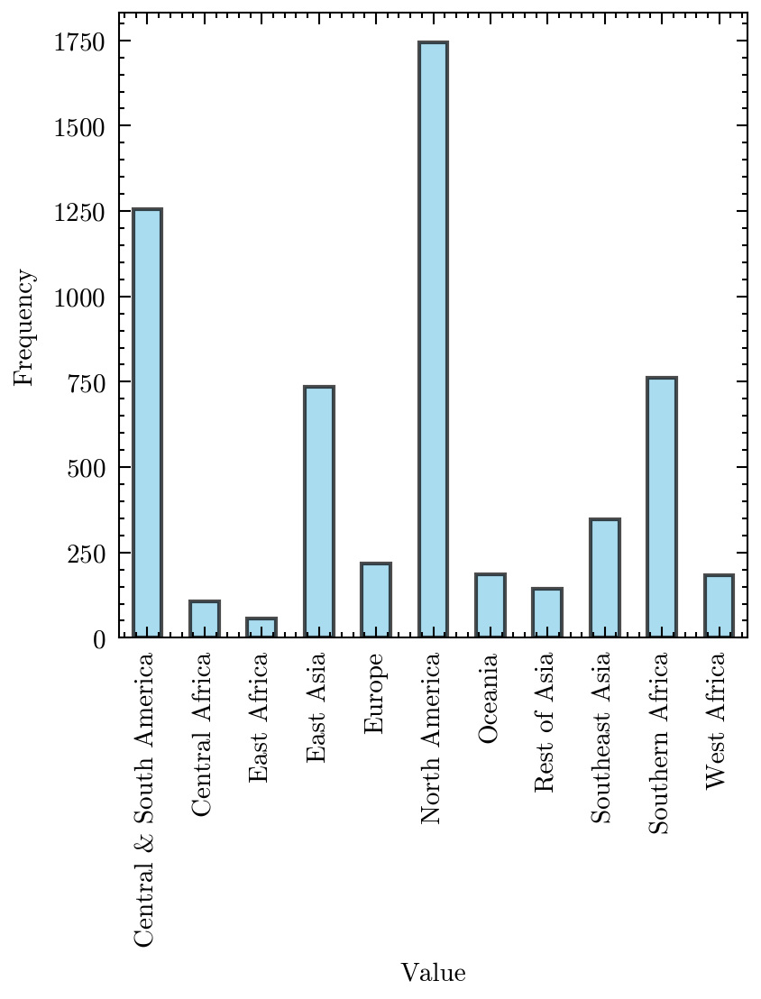

In [515]:
for i in ['primary_commodity', 'year', 'region']:
    f, ax = plt.subplots(1, 1, figsize=(3, 3), dpi=300)
    train[i].value_counts().sort_index().plot(ax=ax, kind='bar', color='skyblue', edgecolor='black', alpha=0.7)
    plt.xlabel("Value")
    plt.ylabel("Frequency")


## imputation

In [283]:
for i in ['production_r', 'precipitation', 'runoff', 'month', 'year',
           'pop_density', 'CRI', 'IMR', 'Adjusted Net National Income per capita', 'FDI', 'Literacy Rate (%)',
           'Government Effectiveness', 'Natural Resources Rents (% of GDP)',
           'GDP per capita', 'Rule of Law', 'Control of Corruption',
           'Education Expenditure (% of GDP)', 'Poverty Rate (%)',
           'Unemployment Rate (%)', 'Urban Population (%)']:   
    train[i] = train[i].fillna(train[i].mean())


## standardlization

In [287]:
from sklearn.preprocessing import StandardScaler

feats = ['production_r', 'precipitation', 'runoff', 'month', 'year', 'FDI',
       'pop_density', 'CRI', 'IMR', 'Literacy Rate (%)', 'Life Expectancy',
       'Government Effectiveness', 'Natural Resources Rents (% of GDP)',
       'GDP per capita', 'Rule of Law', 'Control of Corruption',
       'Education Expenditure (% of GDP)', 'Poverty Rate (%)',
       'Unemployment Rate (%)', 'Urban Population (%)', 'Adjusted Net National Income per capita']
scaler = StandardScaler()
train[feats] = scaler.fit_transform(train[feats])
train.select_dtypes(exclude='O').mean().astype(int)


prop_id                                            42084
GLOBALEVENTID                                  811813256
Dist                                                  25
production_r                                           0
AvgTone                                               -1
longitude                                            -15
latitude                                               9
year                                                   0
month                                                  0
is_ETM                                                 1
Drought and Desertification                            0
Flooding and Excess Water                              0
Water Economics, Policy and Management                 0
Water Quality and Pollution                            0
Water Supply, Sanitation and Infrastructure            0
pop_density                                            0
IMR                                                    0
precipitation                  

## feature engineering

In [288]:
# temp = pd.get_dummies(train['current_stage']).astype(int)
# train = pd.concat([train, temp], axis=1)


In [289]:
# temp = pd.get_dummies(train['region']).astype(int)
# train = pd.concat([train, temp], axis=1)


In [290]:
# temp = pd.get_dummies(train['category']).astype(int)
# train = pd.concat([train, temp], axis=1)


In [291]:
# temp = pd.get_dummies(train['primary_commodity']).astype(int)
# train = pd.concat([train, temp], axis=1)


In [292]:
# train['has_production_r'] = (train['production_r']>0).astype(int)


## test random-effect

In [294]:
# import statsmodels.api as sm
# import statsmodels.formula.api as smf
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import classification_report
# import statsmodels.api as sm
# import statsmodels.api as sm
# from scipy.stats import chi2
# import shap

# train2 = train.copy()
# print(train2.shape)
# train2 = train2.rename(columns={'Drought and Desertification':'Drought_and_Desertification',
#                       'Flooding and Excess Water':'Flooding_and_Excess_Water',
#                       'Water Economics, Policy and Management':'Water_Economics_Policy_and_Management',
#                       'Water Quality and Pollution':'Water_Quality_and_Pollution',
#                       'Water Supply, Sanitation and Infrastructure':'Water_Supply_Sanitation_and_Infrastructure'})
# train2 = train2.rename(columns=feature_mapping)
# cols = train2.select_dtypes(exclude=['O']).columns
# cols = [col for col in cols if col not in ['prop_id', 'latitude', 'longitude',
#                                           'IMR', 'has_prod', 'is_ETM',
#                                           'income_per_capita', 'literacy_rate', 'FDI',
#                                           'AvgTone', 'GLOBALEVENTID']+\
#                                           train2[cols].std()[train2[cols].std()==0].index.tolist() +\
#                                           targets]



# group_col = ['region', 'year', 'primary_commodity']

# formula = "AvgTone ~ " + " + ".join([col for col in cols if col not in group_col]) + " + " +\
#           " + ".join([f"C(%s)"%col for col in group_col])
# model = sm.OLS.from_formula(formula, data=train2)
# result = model.fit()

# for g in group_col:
#     formula = "AvgTone ~ " + " + ".join([col for col in cols if col not in group_col]) + " + " +\
#               " + ".join([f"C(%s)"%col for col in group_col])
#     model2 = smf.mixedlm(formula, data=train2, groups=g)
#     result2 = model.fit()

#     lrt_stat = 2 * (result.llf - result2.llf)
#     p_value = 1 - scipy.stats.chi2.cdf(lrt_stat, df=1)  # Degrees of freedom = 1
#     print("LRT statistic:", lrt_stat, "P-value:", p_value)


## final model

In [460]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
import statsmodels.api as sm
import shap

targets = [
  'Drought and Desertification',
  'Flooding and Excess Water',
  'Water Quality and Pollution',
  'Water Economics, Policy and Management',
  'Water Supply, Sanitation and Infrastructure']

models = {}
models_all = {}
for i in targets:
    print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++\n'*5, i)
    train2 = train[train[i]==1]
    print(train2.shape)

    feature_mapping = {
        'production_r': 'prod',
        'month': 'mnth',
        'pop_density': 'pop_density',
        'precipitation': 'precip',
        'runoff': 'runoff',
        'FDI': 'FDI',
        'Control of Corruption': 'control_corruption',
        'Government Effectiveness': 'gov_effectiveness',
        'Adjusted Net National Income per capita': 'income_per_capita',
        'GDP per capita': 'GDP_per_capita',
        'Natural Resources Rents (% of GDP)': 'nat_resources_rents',
        'Rule of Law': 'rule_of_law',
        'Literacy Rate (%)': 'literacy_rate',
        'Education Expenditure (% of GDP)': 'edu_expenditure',
        'Poverty Rate (%)': 'poverty_rate',
        'Unemployment Rate (%)': 'unemployment_rate',
        'Life Expectancy': 'life_expectancy',
        'Urban Population (%)': 'urban_pop',
        'Closed-stage': 'closed_stage',
        'Development-stage': 'dev_stage',
        'Exploration-stage': 'exploration_stage',
        'Operating-stage': 'operating_stage',
        'has_production_r': 'has_prod'
    }
    train2 = train2.rename(columns=feature_mapping)

    cols = train2.select_dtypes(exclude=['O']).columns
    cols = [col for col in cols if col not in ['prop_id', 'latitude', 'longitude',
                                              'has_prod', 'is_ETM', 'poverty_rate', 'production',
                                              'income_per_capita', 'literacy_rate', 'control_corruption',
                                              'rule_of_law', 'nat_resources_rents', 
                                              'pop_density', 'FDI', 'IMR', 'Dist',
                                              'AvgTone', 'GLOBALEVENTID']+\
                                              train2[cols].std()[train2[cols].std()==0].index.tolist() +\
                                              targets]


    group_col = ['region', 'year', 'primary_commodity']
    formula = "AvgTone ~ " + " + ".join([col for col in cols if col not in group_col]) + " + " +\
              " + ".join([f"C(%s)"%col for col in group_col+['year']])  # Exclude group column from fixed effects
    model = smf.glm(formula, data=train2)
    result = model.fit(cov_type='HC3')
    
    # Print the model summary
    print(result.summary())
#     result.summary()
    res_all = result.summary().tables[1]
    res_all = pd.DataFrame(res_all.data).loc[1:].set_index(0).replace('', np.nan).astype(float)
    res_all.columns = ['Coef.', 'srd err', 'z', 'P>|z|', '[0.024', '0.075]']
    
    res = res_all.loc[[i for i in res_all.index if not i.startswith('C(')]].astype(float)
    models.update({i:res})
    models_all.update({i:res_all})
    

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
 Drought and Desertification
(864, 40)
                 Generalized Linear Model Regression Results                  
Dep. Variable:                AvgTone   No. Observations:                  864
Model:                            GLM   Df Residuals:                      825
Model Family:                Gaussian   Df Model:                           38
Link Function:               identity   Scale:                          4.8990
Method:                          IRLS   Log-Likelihood:                -1892.5
Date:                Thu, 26 Dec 2024   Deviance:                       4041.7
Time:                        15:58:16   Pea

                 Generalized Linear Model Regression Results                  
Dep. Variable:                AvgTone   No. Observations:                  455
Model:                            GLM   Df Residuals:                      418
Model Family:                Gaussian   Df Model:                           36
Link Function:               identity   Scale:                          4.7285
Method:                          IRLS   Log-Likelihood:                -979.77
Date:                Thu, 26 Dec 2024   Deviance:                       1976.5
Time:                        15:58:17   Pearson chi2:                 1.98e+03
No. Iterations:                     3   Pseudo R-squ. (CS):             0.3681
Covariance Type:                  HC3                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

                 Generalized Linear Model Regression Results                  
Dep. Variable:                AvgTone   No. Observations:                 4559
Model:                            GLM   Df Residuals:                     4520
Model Family:                Gaussian   Df Model:                           38
Link Function:               identity   Scale:                          5.9220
Method:                          IRLS   Log-Likelihood:                -10504.
Date:                Thu, 26 Dec 2024   Deviance:                       26768.
Time:                        15:58:17   Pearson chi2:                 2.68e+04
No. Iterations:                     3   Pseudo R-squ. (CS):            0.08593
Covariance Type:                  HC3                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

## plot

In [296]:
all_results = []
for model_name, dat in models.items():
    dat = dat.copy()
    dat['Model'] = model_name
    dat['Variable'] = dat.index
    all_results.append(dat.reset_index(drop=True))

combined_df = pd.concat(all_results, ignore_index=True)
reversed_mapping = {v: k for k, v in feature_mapping.items()}
combined_df['Variable'] = combined_df['Variable'].replace(reversed_mapping)
combined_df['Variable'] = combined_df['Variable'].replace({
    'is_ETM':'ETM-related', 'runoff':'Runoff',
    'month':'Month',
    'precipitation':'Precipitation'})
combined_df


,Coef.,srd err,z,P>|z|,[0.024,0.075],Model,Variable
0,-1.1738,0.895,-1.312,0.190,-2.928,0.580,Drought and Desertification,Intercept
1,-0.0291,0.198,-0.147,0.883,-0.417,0.358,Drought and Desertification,production_r
2,0.0035,0.081,0.043,0.965,-0.156,0.163,Drought and Desertification,Month
3,0.6001,0.141,4.257,0.000,0.324,0.876,Drought and Desertification,Precipitation
4,0.3961,0.154,2.570,0.010,0.094,0.698,Drought and Desertification,Runoff
5,0.3411,0.349,0.976,0.329,-0.344,1.026,Drought and Desertification,Government Effectiveness
6,0.4460,0.381,1.171,0.242,-0.300,1.192,Drought and Desertification,GDP per capita
7,0.4980,0.235,2.115,0.034,0.037,0.959,Drought and Desertification,Education Expenditure (% of GDP)
8,1.0445,0.493,2.120,0.034,0.079,2.010,Drought and Desertification,Unemployment Rate (%)
9,0.2433,0.811,0.300,0.764,-1.347,1.834,Drought and Desertification,Life Expectancy


In [297]:
stat = combined_df.set_index(['Variable', 'Model'])[['Coef.', 'P>|z|']].unstack()#.fillna(0)
stat


Coef.                                                                                                                                                                P>|z|                                                                                                                                         
Model                            Drought and Desertification Flooding and Excess Water Water Economics, Policy and Management Water Quality and Pollution Water Supply, Sanitation and Infrastructure Drought and Desertification Flooding and Excess Water Water Economics, Policy and Management Water Quality and Pollution Water Supply, Sanitation and Infrastructure
Variable                                                                                                                                                                                                                                                                                                                                                                  
CRI                                                  -0.0691                   -0.3342                                 0.0822                      0.8479                                      0.0441                       0.783                     0.071                                  0.342                       0.016                                       0.590
Education Expenditure (% of GDP)                      0.4980                    0.8359                                 0.0766                      1.1015                                      0.1898                       0.034                     0.000                                  0.404                       0.030                                       0.045
GDP per capita                                        0.4460                   -0.6738                                 0.4504                     -1.6434                                     -0.0211                       0.242                     0.033                                  0.004                       0.055                                       0.895
Government Effectiveness                              0.3411                    0.7296                                -0.1956                      0.9945                                      0.2861                       0.329                     0.000                                  0.048                       0.099                                       0.002
Intercept                                            -1.1738                   -1.5239                                -1.9064                     -7.0591                                     -1.3748                       0.190                     0.014                                  0.000                       0.000                                       0.001
Life Expectancy                                       0.2433                    0.7259                                 0.2286                      0.4650                                      0.5980                       0.764                     0.062                                  0.270                       0.659                                       0.004
Month                                                 0.0035                   -0.1282                                -0.0655                      0.1002                                     -0.0924                       0.965                     0.080                                  0.080                       0.290                                       0.016
Precipitation                                         0.6001                    0.2882                                 0.1448                     -0.2565                                      0.1325                       0.000                     0.000                                  0.000                       0.041                                       0.001
Runoff                                                0.3961  